# 데이터셋 불러오기

In [12]:
# IMA이미지를 불러오는 라이브러리
import pydicom

import numpy as np
import torch
import torchvision.transforms as transforms
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['figure.figsize'] = [3.0, 3.0]
import seaborn as sns
import torch.nn as nn

In [13]:
import glob

L_list = glob.glob('/root/Mayo2016/*')
L_list = [path.split('/')[-1] for path in L_list]
L_list.sort()
L_list

['L067',
 'L096',
 'L109',
 'L143',
 'L192',
 'L286',
 'L291',
 'L310',
 'L333',
 'L506']

In [14]:
data_label = ['quarter_1mm', 'full_1mm']

In [15]:
def normlize(path):
  dicom_data = pydicom.dcmread(path)
  img = dicom_data.pixel_array.astype(np.float32) * dicom_data.RescaleSlope + dicom_data.RescaleIntercept
  mu, sd = (-500,500)
  scaled_img = (img - mu) / sd
  img = np.expand_dims(scaled_img, axis=0)

  return img # 1x512x512

In [16]:
def extract_patches(img, patch_size=55, interval=55):
  patches = []
  _, height, width = img.shape
  for y in range(0, height - patch_size + 1, interval):
    for x in range(0, width - patch_size + 1, interval):
      patch = img[:, y:y + patch_size, x:x + patch_size]
      patches.append(patch)
  patches = np.array(patches)
  return patches # patch수x1x55x55

In [17]:
import random
from scipy.ndimage import rotate, zoom

def augment_patches(X_patches, y_patches, p=0.5):
    X_augmented_patches, y_augmented_patches = [], []
    
    # random이 들어가기에, X랑 y를 동시에 넣어준다.
    for i, (X_patch, y_patch) in enumerate(zip(X_patches, y_patches)):
        # 원본 패치 추가
        X_augmented_patches.append(X_patch)
        y_augmented_patches.append(y_patch)

        if random.random() < p:
            # 1. 90, 270으로 돌려보자.(뒤집기랑 조금 다르긴 하지만, 점대칭 vs 선대칭, 그냥 +-90도만 쓰자.)
            X, y = rotate(X_patch, 90, axes=(1, 2), reshape=False), rotate(y_patch, 90, axes=(1, 2), reshape=False)
            X_augmented_patches.append(X)
            y_augmented_patches.append(y)
            X, y = rotate(X_patch, -90, axes=(1, 2), reshape=False), rotate(y_patch, -90, axes=(1, 2), reshape=False)
            X_augmented_patches.append(X)
            y_augmented_patches.append(y)
        if random.random() < p:
            # 2. 수직 뒤집기
            X,y = np.flip(X_patch, axis=1),np.flip(y_patch, axis=1)
            X_augmented_patches.append(X)
            y_augmented_patches.append(y)
        if random.random() < p:
            # 3. 수평 뒤집기
            X,y = np.flip(X_patch, axis=2),np.flip(y_patch, axis=2)
            X_augmented_patches.append(X)
            y_augmented_patches.append(y)

    return np.array(X_augmented_patches), np.array(y_augmented_patches)

In [18]:
def patch_maker_W_aug(X_dir, y_dir):
  X_img, y_img = normlize(X_dir), normlize(y_dir)
  X_patches = extract_patches(img=X_img, patch_size=55, interval=55)
  y_patches = extract_patches(img=y_img, patch_size=55, interval=55)
  X_augmented_patches, y_augmented_patches = augment_patches(X_patches, y_patches, p=0.5)
  return X_augmented_patches, y_augmented_patches

In [19]:
def patch_maker_WO_aug(X_dir, y_dir):
  X_img, y_img = normlize(X_dir), normlize(y_dir)
  X_patches = extract_patches(img=X_img, patch_size=55, interval=55)
  y_patches = extract_patches(img=y_img, patch_size=55, interval=55)
  return X_patches, y_patches

In [20]:
import os
from torch.utils.data import Dataset
import torch
import glob
from tqdm import tqdm

class CustomDataset(Dataset):
    def __init__(self, data_type, patch_maker, L_list):
        self.data_type = data_type
        self.patch_maker = patch_maker
        self.L_list = L_list
        self.image_pairs = []

        X_dir_list, y_dir_list = [], []
        for L in self.L_list:
            X_dir, y_dir = self.get_data_range(L)
            X_dir_list += X_dir
            y_dir_list += y_dir

        for X_dir, y_dir in tqdm(zip(X_dir_list, y_dir_list), total=len(X_dir_list), desc=f"{self.data_type} is processing"):
            X_patches, y_patches = self.patch_maker(X_dir, y_dir)
            for i in range(X_patches.shape[0]):
                X_patch, y_patch = torch.from_numpy(X_patches[i]), torch.from_numpy(y_patches[i]) # torch로 넣어주자.
                self.image_pairs.append((X_patch, y_patch))

    def get_data_range(self, L):
        """슬라이싱 범위를 설정하는 함수"""
        X_dir = sorted(glob.glob(f'/root/Mayo2016/{L}/{data_label[0]}/*.IMA'))
        y_dir = sorted(glob.glob(f'/root/Mayo2016/{L}/{data_label[1]}/*.IMA'))
        n1, n2 = len(X_dir), len(y_dir)
        
        if self.data_type == 'train':
            X_range = X_dir[:int(n1 * 0.64)]
            y_range = y_dir[:int(n2 * 0.64)]
        elif self.data_type == 'val':
            X_range = X_dir[int(n1 * 0.64):int(n1 * 0.8)]
            y_range = y_dir[int(n2 * 0.64):int(n2 * 0.8)]
        else:  # test
            X_range = X_dir[int(n1 * 0.8):]
            y_range = y_dir[int(n2 * 0.8):]

        return X_range, y_range

    def __len__(self):
        return len(self.image_pairs)

    def __getitem__(self, idx):
        X = self.image_pairs[idx][0]
        y = self.image_pairs[idx][1]
        return X, y

In [21]:
# 파일 경로 설정

root = '/root/code/'
train_path = root+'train_dataset.pt'
val_path = root+'val_dataset.pt'
test_path = root+'test_dataset.pt'

In [22]:
# 4분 정도 소요

# 데이터셋 불러오기
train_dataset = torch.load(train_path)
val_dataset = torch.load(val_path)
test_dataset = torch.load(test_path) # 45초

In [23]:
batch_size = 16
from torch.utils.data import DataLoader
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

In [24]:
len(train_loader), len(val_loader), len(test_loader)

(57596, 4815, 6025)

# attention모델1 (SEBlock); Channel Attention

In [25]:
class SEBlock(nn.Module):
    def __init__(self, channels, reduction=16):
        super(SEBlock, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channels, channels // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channels // reduction, channels, bias=False),
            nn.Sigmoid()
        )
        self.last_attention = None  # 저장된 Attention 값을 위한 변수

    def forward(self, x):
        batch, channels, _, _ = x.size()
        # 채널별 전역 평균 풀링
        y = self.avg_pool(x).view(batch, channels)
        y = self.fc(y).view(batch, channels, 1, 1)
        self.last_attention = y  # 계산된 Attention Weight 저장
        return x * y


In [26]:
# class SEBlock(nn.Module):
#     def __init__(self, in_channels, reduction=16):
#         super(SEBlock, self).__init__()
#         self.global_avg_pool = nn.AdaptiveAvgPool2d(1)  # 채널별로 matrix(가로x세로)의 평균을 계산한다.
#         self.fc1 = nn.Linear(in_channels, in_channels // reduction, bias=False)  # 축소
#         self.fc2 = nn.Linear(in_channels // reduction, in_channels, bias=False)  # 복원
#         self.sigmoid = nn.Sigmoid()  # 가중치 계산

#     def forward(self, x):
#         batch, channels, _, _ = x.size()
#         y = self.global_avg_pool(x).view(batch, channels)  # 채널별 압축
#         y = self.fc1(y)
#         y = nn.ReLU()(y)
#         y = self.fc2(y)
#         y = self.sigmoid(y).view(batch, channels, 1, 1)  # 가중치를 입력 텐서 크기로 복원
#         return x * y  # 채널별로 가중치 적용

## SEBlock 살펴보기

In [27]:
X_train, y_train = next(iter(train_loader))

conv_layer = nn.Conv2d(1, 96, 5, 1, 0)
conv_x = conv_layer(X_train)

se1 = SEBlock(96)
se_x = se1(conv_x)

X_train.shape, conv_layer(X_train).shape, se_x.shape

(torch.Size([16, 1, 55, 55]),
 torch.Size([16, 96, 51, 51]),
 torch.Size([16, 96, 51, 51]))

#### 1. channel 마다 avgpool

In [28]:
global_avg_pool = nn.AdaptiveAvgPool2d(1) # channel마다 feature-map의 값을 하나의 mean값으로 만든다.
global_avg_pool(X_train).shape

torch.Size([16, 1, 1, 1])

In [29]:
batch, channels, _, _ = X_train.size()
global_avg_pool(X_train).view(batch, channels).shape

torch.Size([16, 1])

In [30]:
tensor = torch.tensor([
    [[1, 1], [1, 1]],  # 첫 번째 채널
    [[2, 2], [2, 2]],  # 두 번째 채널
    [[3, 3], [3, 3]]   # 세 번째 채널
], dtype=torch.float32)

tensor

tensor([[[1., 1.],
         [1., 1.]],

        [[2., 2.],
         [2., 2.]],

        [[3., 3.],
         [3., 3.]]])

In [31]:
# 배치 차원을 추가 (모델 입력 형태로 만들기 위해)
tensor = tensor.unsqueeze(0)
tensor.shape

torch.Size([1, 3, 2, 2])

In [32]:
global_avg_pool(tensor), global_avg_pool(tensor).shape

(tensor([[[[1.]],
 
          [[2.]],
 
          [[3.]]]]),
 torch.Size([1, 3, 1, 1]))

In [33]:
batch, channels, _, _ = global_avg_pool(tensor).size()
global_avg_pool(global_avg_pool(tensor)).view(batch, channels).shape

torch.Size([1, 3])

In [34]:
global_avg_pool(global_avg_pool(tensor)).view(batch, channels)

tensor([[1., 2., 3.]])

#### 2. auto-encoder 구조로 압축했다 늘리기

In [35]:
conv_layer = nn.Conv2d(1, 96, 5, 1, 0)
conv_x = conv_layer(X_train)
batch, channels, _, _ = conv_x.size()
y = global_avg_pool(conv_x).view(batch, channels)

in_channels = 96
reduction = 16
fc1 = nn.Linear(in_channels, in_channels // reduction, bias=False)  # 축소
fc2 = nn.Linear(in_channels // reduction, in_channels, bias=False)  # 복원

print(y.shape)
y = fc1(y) # 중간에 6으로 축소
print(y.shape)
y = nn.ReLU()(y)
y = fc2(y)
print(y.shape) # 다시 96으로 늘리기

torch.Size([16, 96])
torch.Size([16, 6])
torch.Size([16, 96])


#### 3. sigmoid로 0~1 사이값으로 만들어서, 가중치로 실제값에 곱하기

In [36]:
sigmoid = nn.Sigmoid()  # 가중치 계산
y = sigmoid(y).view(batch, channels, 1, 1)  # 가중치를 입력 텐서 크기로 복원

y.shape, y.max(), y.min()

(torch.Size([16, 96, 1, 1]),
 tensor(0.5696, grad_fn=<MaxBackward1>),
 tensor(0.4319, grad_fn=<MinBackward1>))

In [37]:
(conv_x * y).shape

torch.Size([16, 96, 51, 51])

## 모델구현

2개의 attention을 앞단의 중간과 마지막 부분에 각각 설치

In [38]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [39]:
class RedCNNWithChannelAttention(nn.Module):
    def __init__(self):
        super(RedCNNWithChannelAttention, self).__init__()

        # 인코더 부분
        self.conv1 = nn.Conv2d(1, 96, 5, 1, 0)
        self.conv2 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv3 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv4 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv5 = nn.Conv2d(96, 96, 5, 1, 0)

        # Attention Blocks (효율적 배치)
        self.attention2 = SEBlock(96)  # 중간 계층
        self.attention3 = SEBlock(96)  # 고수준 특징 계층

        # 디코더 부분
        self.deconv1 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv2 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv3 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv4 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv_last = nn.ConvTranspose2d(96, 1, 5, 1, 0)

        self.relu = nn.ReLU()

    def forward(self, x):
        # 인코더 부분
        residual1 = x
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        residual2 = x
        x = self.relu(self.conv3(x))
        x = self.attention2(x)  # 중간 계층에 Attention
        x = self.relu(self.conv4(x))
        residual3 = x
        x = self.relu(self.conv5(x))
        x = self.attention3(x)  # 최종 인코더 계층에 Attention

        # 디코더 부분
        x = self.relu(self.deconv1(x) + residual3)
        x = self.relu(self.deconv2(x))
        x = self.relu(self.deconv3(x) + residual2)
        x = self.relu(self.deconv4(x))
        x = self.deconv_last(x) + residual1

        return x

In [40]:
model = RedCNNWithChannelAttention().to(device)
model

RedCNNWithChannelAttention(
  (conv1): Conv2d(1, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv3): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv4): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv5): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (attention2): SEBlock(
    (avg_pool): AdaptiveAvgPool2d(output_size=1)
    (fc): Sequential(
      (0): Linear(in_features=96, out_features=6, bias=False)
      (1): ReLU(inplace=True)
      (2): Linear(in_features=6, out_features=96, bias=False)
      (3): Sigmoid()
    )
  )
  (attention3): SEBlock(
    (avg_pool): AdaptiveAvgPool2d(output_size=1)
    (fc): Sequential(
      (0): Linear(in_features=96, out_features=6, bias=False)
      (1): ReLU(inplace=True)
      (2): Linear(in_features=6, out_features=96, bias=False)
      (3): Sigmoid()
    )
  )
  (deconv1): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv2): ConvTranspose2d(96, 9

In [41]:
%cd /root/code

import utils.EarlyStopping
import utils.LRScheduler
import utils.train_eval_util
import importlib
importlib.reload(utils.EarlyStopping)
importlib.reload(utils.LRScheduler)
importlib.reload(utils.train_eval_util)

/root/code


<module 'utils.train_eval_util' from '/root/code/utils/train_eval_util.py'>

In [42]:
import torch.nn as nn
criterion = nn.MSELoss()

from utils.EarlyStopping import *
from utils.LRScheduler import *
from utils.train_eval_util import train, evaluate

learning_rate = 1e-5
optimizer = torch.optim.Adam(params = model.parameters(),
                             lr = learning_rate)


early_stopping = EarlyStopping(patience = 7, # 7번까지는 개선이 안되어도 봐준다.
                               min_delta = 1e-5) # 이정도는 개선이 되어야한다. 아니면 위의 patience까지 count하다가 stop


scheduler = LRScheduler(optimizer = optimizer,
                        patience = 5,
                        min_lr = 1e-10,
                        factor = 0.5)

In [43]:
import torch
from tqdm import tqdm

interval = 1000

def train(model, train_loader, optimizer, criterion, device, epoch):
    model.train()
    running_loss = 0.0
    loss_list = []
    total_loss = 0

    for i, data in tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch} - Training"):
        X, y = data[0].to(device), data[1].to(device)
        optimizer.zero_grad()
        X_hat = model(X)
        loss = criterion(X_hat, y)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

    return loss_list, total_loss / len(train_loader.dataset)

def evaluate(model, loader, criterion, device, epoch):
    model.eval()
    running_loss = 0.0
    loss_list = []
    total_loss = 0

    with torch.no_grad():
        for i, data in tqdm(enumerate(loader), total=len(loader), desc=f"Epoch {epoch} - Evaluating"):
            X, y = data[0].to(device), data[1].to(device)
            X_hat = model(X)
            loss = criterion(X_hat, y)

            running_loss += loss.item() * X.size(0)

            if i % interval == interval-1:
                interval_loss = running_loss / interval
                loss_list.append(interval_loss)
                total_loss += running_loss
                running_loss = 0.0
                tqdm.write(f'train loss : {interval_loss}')

    return loss_list, total_loss / len(loader.dataset)

# 학습

In [44]:
!pwd

/root/code


In [45]:
%cd /root/code/redcnn/attention_channel

/root/code/redcnn/attention_channel


In [46]:
epochs = 2 # 각 epoch마다 train(20분), valid(2분)이 소요된다.
best_valid_loss = float('inf')
train_loss_per_iter = []
train_loss_per_epoch = []
val_loss_per_iter = []
val_loss_per_epoch = []

for epoch in range(epochs):
    loss_list, total_loss = train(model, train_loader, optimizer, criterion, device, epoch)
    train_loss_per_iter.append(loss_list)
    train_loss_per_epoch.append(total_loss)

    loss_list, total_loss = evaluate(model, val_loader, criterion, device, epoch)
    val_loss_per_iter.append(loss_list)
    val_loss_per_epoch.append(total_loss)

    print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {train_loss_per_epoch[-1]:.4f}, Valid Loss: {val_loss_per_epoch[-1]:.4f}")

    valid_loss = val_loss_per_epoch[-1]
    scheduler(valid_loss)

    if (early_stopping(valid_loss)):
        break

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        epochs_no_improve = 0
        torch.save(model.state_dict(), "./" + 'red_cnn_C_A' + ".pth")

Epoch 0 - Training:   1%|          | 616/57596 [00:13<19:13, 49.38it/s] 

Epoch 0 - Training:   2%|▏         | 1006/57596 [00:21<19:14, 49.03it/s]

train loss : 0.09035961556434631


Epoch 0 - Training:   3%|▎         | 2006/57596 [00:41<18:50, 49.18it/s]

train loss : 0.05864586570300162


Epoch 0 - Training:   5%|▌         | 3006/57596 [01:01<18:33, 49.04it/s]

train loss : 0.05443556704744697


Epoch 0 - Training:   7%|▋         | 4006/57596 [01:21<18:11, 49.08it/s]

train loss : 0.05118197832070291


Epoch 0 - Training:   9%|▊         | 5006/57596 [01:42<17:54, 48.94it/s]

train loss : 0.04868892845697701


Epoch 0 - Training:  10%|█         | 6006/57596 [02:02<17:30, 49.11it/s]

train loss : 0.04779931397177279


Epoch 0 - Training:  12%|█▏        | 7006/57596 [02:22<17:10, 49.10it/s]

train loss : 0.046764785388484595


Epoch 0 - Training:  14%|█▍        | 8006/57596 [02:42<16:49, 49.13it/s]

train loss : 0.04577351571433246


Epoch 0 - Training:  16%|█▌        | 9006/57596 [03:03<16:30, 49.07it/s]

train loss : 0.04502226622961462


Epoch 0 - Training:  17%|█▋        | 10006/57596 [03:23<16:09, 49.10it/s]

train loss : 0.04378162221424282


Epoch 0 - Training:  19%|█▉        | 11006/57596 [03:43<15:50, 49.04it/s]

train loss : 0.044034493822604416


Epoch 0 - Training:  21%|██        | 12006/57596 [04:03<15:28, 49.13it/s]

train loss : 0.042881717143580314


Epoch 0 - Training:  23%|██▎       | 13006/57596 [04:23<15:07, 49.12it/s]

train loss : 0.042255138348788024


Epoch 0 - Training:  24%|██▍       | 14006/57596 [04:44<14:49, 49.03it/s]

train loss : 0.042637461243197325


Epoch 0 - Training:  26%|██▌       | 15006/57596 [05:04<14:28, 49.06it/s]

train loss : 0.04211468171700835


Epoch 0 - Training:  28%|██▊       | 16006/57596 [05:24<14:09, 48.98it/s]

train loss : 0.042001687521114946


Epoch 0 - Training:  30%|██▉       | 17006/57596 [05:44<13:47, 49.04it/s]

train loss : 0.04146769863180816


Epoch 0 - Training:  31%|███▏      | 18006/57596 [06:05<13:27, 49.04it/s]

train loss : 0.04137120506539941


Epoch 0 - Training:  33%|███▎      | 19006/57596 [06:25<13:06, 49.06it/s]

train loss : 0.04130856072902679


Epoch 0 - Training:  35%|███▍      | 20006/57596 [06:45<12:45, 49.11it/s]

train loss : 0.04065348394028843


Epoch 0 - Training:  36%|███▋      | 21006/57596 [07:05<12:25, 49.06it/s]

train loss : 0.0403976166266948


Epoch 0 - Training:  38%|███▊      | 22006/57596 [07:26<12:06, 49.02it/s]

train loss : 0.040159696623682975


Epoch 0 - Training:  40%|███▉      | 23006/57596 [07:46<11:44, 49.08it/s]

train loss : 0.04068501906096935


Epoch 0 - Training:  42%|████▏     | 24006/57596 [08:06<11:23, 49.13it/s]

train loss : 0.04014978530816734


Epoch 0 - Training:  43%|████▎     | 25006/57596 [08:26<11:04, 49.08it/s]

train loss : 0.039889329293742774


Epoch 0 - Training:  45%|████▌     | 26006/57596 [08:47<10:42, 49.14it/s]

train loss : 0.03911337783187628


Epoch 0 - Training:  47%|████▋     | 27006/57596 [09:07<10:24, 48.98it/s]

train loss : 0.039090311024338006


Epoch 0 - Training:  49%|████▊     | 28006/57596 [09:27<10:03, 49.01it/s]

train loss : 0.03931941034831107


Epoch 0 - Training:  50%|█████     | 29006/57596 [09:47<09:42, 49.05it/s]

train loss : 0.03901912363432348


Epoch 0 - Training:  52%|█████▏    | 30006/57596 [10:08<09:22, 49.07it/s]

train loss : 0.038999571779742837


Epoch 0 - Training:  54%|█████▍    | 31006/57596 [10:28<09:02, 49.00it/s]

train loss : 0.03874487577937544


Epoch 0 - Training:  56%|█████▌    | 32006/57596 [10:48<08:41, 49.09it/s]

train loss : 0.03855860923044384


Epoch 0 - Training:  57%|█████▋    | 33006/57596 [11:08<08:21, 49.06it/s]

train loss : 0.03846866659261286


Epoch 0 - Training:  59%|█████▉    | 34006/57596 [11:29<08:00, 49.07it/s]

train loss : 0.03858555209077895


Epoch 0 - Training:  61%|██████    | 35006/57596 [11:49<07:40, 49.07it/s]

train loss : 0.03813055859319866


Epoch 0 - Training:  63%|██████▎   | 36006/57596 [12:09<07:20, 49.04it/s]

train loss : 0.03830220782384276


Epoch 0 - Training:  64%|██████▍   | 37006/57596 [12:29<07:00, 49.00it/s]

train loss : 0.03797350676357746


Epoch 0 - Training:  66%|██████▌   | 38006/57596 [12:50<06:39, 49.04it/s]

train loss : 0.038264284369535745


Epoch 0 - Training:  68%|██████▊   | 39006/57596 [13:10<06:19, 49.02it/s]

train loss : 0.03772211892344057


Epoch 0 - Training:  69%|██████▉   | 40006/57596 [13:30<05:58, 49.09it/s]

train loss : 0.03757832830399275


Epoch 0 - Training:  71%|███████   | 41006/57596 [13:50<05:38, 49.01it/s]

train loss : 0.03803843952715397


Epoch 0 - Training:  73%|███████▎  | 42006/57596 [14:11<05:17, 49.11it/s]

train loss : 0.03806546835042536


Epoch 0 - Training:  75%|███████▍  | 43006/57596 [14:31<04:57, 49.07it/s]

train loss : 0.03834594346769154


Epoch 0 - Training:  76%|███████▋  | 44006/57596 [14:51<04:37, 48.94it/s]

train loss : 0.038037083929404615


Epoch 0 - Training:  78%|███████▊  | 45006/57596 [15:11<04:17, 48.98it/s]

train loss : 0.03724903806485236


Epoch 0 - Training:  80%|███████▉  | 46006/57596 [15:31<03:56, 49.00it/s]

train loss : 0.037357304111123084


Epoch 0 - Training:  82%|████████▏ | 47006/57596 [15:52<03:36, 49.02it/s]

train loss : 0.03698380616120994


Epoch 0 - Training:  83%|████████▎ | 48006/57596 [16:12<03:15, 48.99it/s]

train loss : 0.037689625892788174


Epoch 0 - Training:  85%|████████▌ | 49006/57596 [16:32<02:55, 49.01it/s]

train loss : 0.0372335419151932


Epoch 0 - Training:  87%|████████▋ | 50006/57596 [16:53<02:34, 49.02it/s]

train loss : 0.03676591219380498


Epoch 0 - Training:  89%|████████▊ | 51006/57596 [17:13<02:14, 49.03it/s]

train loss : 0.03739581049606204


Epoch 0 - Training:  90%|█████████ | 52006/57596 [17:33<01:53, 49.10it/s]

train loss : 0.03701625797525048


Epoch 0 - Training:  92%|█████████▏| 53006/57596 [17:53<01:33, 49.04it/s]

train loss : 0.03756365367397666


Epoch 0 - Training:  94%|█████████▍| 54006/57596 [18:13<01:13, 49.04it/s]

train loss : 0.03678507857769728


Epoch 0 - Training:  96%|█████████▌| 55006/57596 [18:34<00:52, 49.06it/s]

train loss : 0.038264946773648265


Epoch 0 - Training:  97%|█████████▋| 56006/57596 [18:54<00:32, 48.90it/s]

train loss : 0.03702062197215855


Epoch 0 - Training:  99%|█████████▉| 57006/57596 [19:14<00:12, 49.06it/s]

train loss : 0.03667003594711423


Epoch 0 - Evaluating:  21%|██        | 1014/4815 [00:08<00:31, 121.42it/s]

train loss : 0.042718916038051245


Epoch 0 - Evaluating:  42%|████▏     | 2015/4815 [00:16<00:23, 121.33it/s]

train loss : 0.04604407144105062


Epoch 0 - Evaluating:  63%|██████▎   | 3016/4815 [00:24<00:14, 121.22it/s]

train loss : 0.030582267046440393


Epoch 0 - Evaluating:  83%|████████▎ | 4017/4815 [00:32<00:06, 121.52it/s]

train loss : 0.03400039943074808


Epoch 0 - Evaluating: 100%|██████████| 4815/4815 [00:39<00:00, 122.19it/s]


Epoch [1/2], Train Loss: 0.0026, Valid Loss: 0.0020


Epoch 1 - Training:   2%|▏         | 1008/57596 [00:20<19:11, 49.14it/s]

train loss : 0.036959696235135196


Epoch 1 - Training:   3%|▎         | 2008/57596 [00:40<18:52, 49.08it/s]

train loss : 0.037136072348803284


Epoch 1 - Training:   5%|▌         | 3008/57596 [01:00<18:30, 49.14it/s]

train loss : 0.03650493488460779


Epoch 1 - Training:   7%|▋         | 4008/57596 [01:21<18:11, 49.11it/s]

train loss : 0.03675992707908154


Epoch 1 - Training:   9%|▊         | 5008/57596 [01:41<17:49, 49.17it/s]

train loss : 0.036534849382936954


Epoch 1 - Training:  10%|█         | 6008/57596 [02:01<17:28, 49.20it/s]

train loss : 0.03605245158262551


Epoch 1 - Training:  12%|█▏        | 7008/57596 [02:21<17:09, 49.16it/s]

train loss : 0.03638322566822171


Epoch 1 - Training:  14%|█▍        | 8008/57596 [02:41<16:49, 49.10it/s]

train loss : 0.03642988184094429


Epoch 1 - Training:  16%|█▌        | 9008/57596 [03:02<16:30, 49.07it/s]

train loss : 0.03614428759831935


Epoch 1 - Training:  17%|█▋        | 10008/57596 [03:22<16:09, 49.10it/s]

train loss : 0.03654800344631076


Epoch 1 - Training:  19%|█▉        | 11008/57596 [03:42<15:48, 49.11it/s]

train loss : 0.036629214582033456


Epoch 1 - Training:  21%|██        | 12008/57596 [04:02<15:27, 49.14it/s]

train loss : 0.03629535851441324


Epoch 1 - Training:  23%|██▎       | 13008/57596 [04:22<15:08, 49.07it/s]

train loss : 0.03658506611175835


Epoch 1 - Training:  24%|██▍       | 14008/57596 [04:43<14:46, 49.15it/s]

train loss : 0.0361734531968832


Epoch 1 - Training:  26%|██▌       | 15008/57596 [05:03<14:25, 49.19it/s]

train loss : 0.03627044395916164


Epoch 1 - Training:  28%|██▊       | 16008/57596 [05:23<14:06, 49.14it/s]

train loss : 0.036333259964361785


Epoch 1 - Training:  30%|██▉       | 17008/57596 [05:43<13:44, 49.24it/s]

train loss : 0.03657479187473655


Epoch 1 - Training:  31%|███▏      | 18008/57596 [06:03<13:24, 49.19it/s]

train loss : 0.036100453887134794


Epoch 1 - Training:  33%|███▎      | 19008/57596 [06:23<13:04, 49.20it/s]

train loss : 0.03575631471723318


Epoch 1 - Training:  35%|███▍      | 20008/57596 [06:44<12:44, 49.15it/s]

train loss : 0.03620710353925824


Epoch 1 - Training:  36%|███▋      | 21008/57596 [07:04<12:23, 49.20it/s]

train loss : 0.03571177284605801


Epoch 1 - Training:  38%|███▊      | 22008/57596 [07:24<12:03, 49.17it/s]

train loss : 0.03646382668055594


Epoch 1 - Training:  40%|███▉      | 23008/57596 [07:44<11:43, 49.16it/s]

train loss : 0.0361124518699944


Epoch 1 - Training:  42%|████▏     | 24008/57596 [08:05<11:24, 49.05it/s]

train loss : 0.035992154352366926


Epoch 1 - Training:  43%|████▎     | 25008/57596 [08:25<11:01, 49.26it/s]

train loss : 0.03552277062647045


Epoch 1 - Training:  45%|████▌     | 26008/57596 [08:45<10:42, 49.20it/s]

train loss : 0.03593556633591652


Epoch 1 - Training:  47%|████▋     | 27008/57596 [09:05<10:22, 49.16it/s]

train loss : 0.03569216349907219


Epoch 1 - Training:  49%|████▊     | 28008/57596 [09:25<10:01, 49.20it/s]

train loss : 0.035785750607028606


Epoch 1 - Training:  50%|█████     | 29008/57596 [09:45<09:41, 49.17it/s]

train loss : 0.035958684891462325


Epoch 1 - Training:  52%|█████▏    | 30008/57596 [10:06<09:20, 49.23it/s]

train loss : 0.035856616193428635


Epoch 1 - Training:  54%|█████▍    | 31008/57596 [10:26<09:00, 49.16it/s]

train loss : 0.03585868110507727


Epoch 1 - Training:  56%|█████▌    | 32008/57596 [10:46<08:40, 49.20it/s]

train loss : 0.03616347477026284


Epoch 1 - Training:  57%|█████▋    | 33008/57596 [11:06<08:20, 49.08it/s]

train loss : 0.035522708248347044


Epoch 1 - Training:  59%|█████▉    | 34008/57596 [11:26<07:59, 49.16it/s]

train loss : 0.035619457334280014


Epoch 1 - Training:  61%|██████    | 35008/57596 [11:47<07:38, 49.22it/s]

train loss : 0.036191989270970226


Epoch 1 - Training:  63%|██████▎   | 36008/57596 [12:07<07:18, 49.20it/s]

train loss : 0.035596741499379275


Epoch 1 - Training:  64%|██████▍   | 37008/57596 [12:27<06:58, 49.22it/s]

train loss : 0.035685041097924114


Epoch 1 - Training:  66%|██████▌   | 38008/57596 [12:47<06:38, 49.18it/s]

train loss : 0.03540168312005699


Epoch 1 - Training:  68%|██████▊   | 39008/57596 [13:07<06:19, 48.92it/s]

train loss : 0.03541258187592029


Epoch 1 - Training:  69%|██████▉   | 40008/57596 [13:28<05:59, 48.96it/s]

train loss : 0.03592186851799488


Epoch 1 - Training:  71%|███████   | 41008/57596 [13:48<05:39, 48.92it/s]

train loss : 0.03499697933811694


Epoch 1 - Training:  73%|███████▎  | 42008/57596 [14:08<05:18, 48.88it/s]

train loss : 0.03587370750866831


Epoch 1 - Training:  75%|███████▍  | 43008/57596 [14:28<04:56, 49.18it/s]

train loss : 0.03558854009117931


Epoch 1 - Training:  76%|███████▋  | 44008/57596 [14:48<04:36, 49.21it/s]

train loss : 0.03619362742640078


Epoch 1 - Training:  78%|███████▊  | 45008/57596 [15:09<04:16, 49.09it/s]

train loss : 0.035757958214730025


Epoch 1 - Training:  80%|███████▉  | 46008/57596 [15:29<03:56, 49.09it/s]

train loss : 0.035491913691163064


Epoch 1 - Training:  82%|████████▏ | 47008/57596 [15:49<03:35, 49.18it/s]

train loss : 0.03517455534823239


Epoch 1 - Training:  83%|████████▎ | 48008/57596 [16:09<03:15, 49.16it/s]

train loss : 0.034924611918628216


Epoch 1 - Training:  85%|████████▌ | 49008/57596 [16:29<02:54, 49.14it/s]

train loss : 0.034957537811249495


Epoch 1 - Training:  87%|████████▋ | 50008/57596 [16:49<02:34, 49.16it/s]

train loss : 0.035358740642666815


Epoch 1 - Training:  89%|████████▊ | 51008/57596 [17:10<02:14, 49.14it/s]

train loss : 0.03520587460976094


Epoch 1 - Training:  90%|█████████ | 52008/57596 [17:30<01:53, 49.14it/s]

train loss : 0.03538430444151163


Epoch 1 - Training:  92%|█████████▏| 53008/57596 [17:50<01:33, 49.13it/s]

train loss : 0.03488854298461229


Epoch 1 - Training:  94%|█████████▍| 54008/57596 [18:10<01:13, 49.10it/s]

train loss : 0.03520507766865194


Epoch 1 - Training:  96%|█████████▌| 55008/57596 [18:30<00:52, 49.07it/s]

train loss : 0.03535317675955594


Epoch 1 - Training:  97%|█████████▋| 56008/57596 [18:51<00:32, 49.05it/s]

train loss : 0.03532448495551944


Epoch 1 - Training:  99%|█████████▉| 57008/57596 [19:11<00:11, 49.10it/s]

train loss : 0.034793405981734395


Epoch 1 - Evaluating:  21%|██        | 1014/4815 [00:08<00:31, 122.07it/s]

train loss : 0.04113142982125282


Epoch 1 - Evaluating:  42%|████▏     | 2015/4815 [00:16<00:22, 122.02it/s]

train loss : 0.044234737308463085


Epoch 1 - Evaluating:  63%|██████▎   | 3016/4815 [00:24<00:14, 122.05it/s]

train loss : 0.02925351332919672


Epoch 1 - Evaluating:  83%|████████▎ | 4017/4815 [00:32<00:06, 122.23it/s]

train loss : 0.03245299228420481


Epoch 1 - Evaluating: 100%|██████████| 4815/4815 [00:39<00:00, 122.99it/s]

Epoch [2/2], Train Loss: 0.0022, Valid Loss: 0.0019


In [47]:
import pickle

data_to_save = {
    'train_loss_per_iter': train_loss_per_iter,
    'val_loss_per_iter': val_loss_per_iter,
    'train_loss_per_epoch': train_loss_per_epoch,
    'val_loss_per_epoch': val_loss_per_epoch
}

for filename, data in data_to_save.items():
    with open(f'{filename}.pkl', 'wb') as f:
        pickle.dump(data, f)

In [48]:
import pickle

filenames = [
    'train_loss_per_iter.pkl',
    'val_loss_per_iter.pkl',
    'train_loss_per_epoch.pkl',
    'val_loss_per_epoch.pkl'
]

variables = [
    'train_loss_per_iter',
    'val_loss_per_iter',
    'train_loss_per_epoch',
    'val_loss_per_epoch'
]

data_to_load = dict(zip(filenames, variables))

for filename, variable_name in data_to_load.items():
    with open(filename, 'rb') as f:
        globals()[variable_name] = pickle.load(f)

In [49]:
train_flatten, val_flatten = [item for sublist in train_loss_per_iter for item in sublist], [item for sublist in val_loss_per_iter for item in sublist]

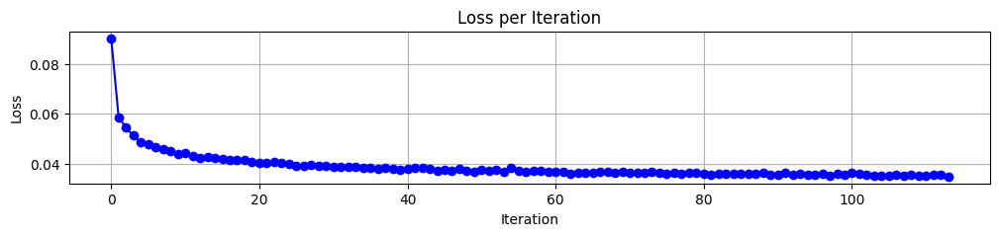

In [50]:
plt.figure(figsize=(12, 2))

# 반복 단위 손실 그래프
plt.plot(train_flatten, label='Train (per iter)', linestyle='-', marker='o', color='blue')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

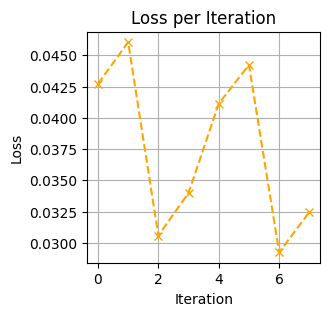

In [51]:
plt.plot(val_flatten, label='Validation (per iter)', linestyle='--', marker='x', color='orange')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

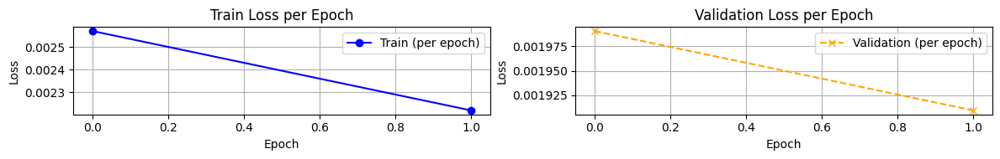

In [52]:
# 1행 2열 레이아웃 생성
fig, axes = plt.subplots(1, 2, figsize=(12, 2))  # 그래프 크기 조정

# Train loss per epoch 그래프
axes[0].plot(train_loss_per_epoch, label='Train (per epoch)', linestyle='-', marker='o', color='blue')
axes[0].set_title("Train Loss per Epoch")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].grid()
axes[0].legend()

# Validation loss per epoch 그래프
axes[1].plot(val_loss_per_epoch, label='Validation (per epoch)', linestyle='--', marker='x', color='orange')
axes[1].set_title("Validation Loss per Epoch")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Loss")
axes[1].grid()
axes[1].legend()

plt.tight_layout()
plt.show()

# 평가

In [53]:
!pwd

/root/code/redcnn/attention_channel


In [54]:
%cd /root/code/redcnn/attention_channel

/root/code/redcnn/attention_channel


In [55]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

## batch size 16

### loss 추이 관찰

In [56]:
criterion = nn.MSELoss()
interval = 1000

# 저장된 모델 로드
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RedCNNWithChannelAttention().to(device)
model.load_state_dict(torch.load('red_cnn_C_A.pth'))

<All keys matched successfully>

In [57]:
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=0)
len(test_loader)

6025

In [58]:
# evaluate부분 + top10 best&worst
model.eval()
running_loss = 0.0
loss_list = []
total_loss = 0
best_loss = np.inf
worst_loss = -np.inf

with torch.no_grad():
    for i, data in tqdm(enumerate(test_loader), total=len(test_loader), desc=f"Evaluating"):
        X, y = data[0].to(device), data[1].to(device)
        X_hat = model(X)
        loss = criterion(X_hat, y)

        if loss < best_loss:
            best_loss = loss
            best = (X,y,X_hat)
        if loss > worst_loss:
            worst_loss = loss
            worst = (X,y,X_hat)

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

Evaluating:  17%|█▋        | 1012/6025 [00:08<00:41, 120.12it/s]

train loss : 0.03597860355628654


Evaluating:  33%|███▎      | 2013/6025 [00:16<00:33, 120.42it/s]

train loss : 0.032969088376965376


Evaluating:  50%|█████     | 3014/6025 [00:24<00:24, 120.70it/s]

train loss : 0.034294864943716676


Evaluating:  67%|██████▋   | 4015/6025 [00:33<00:16, 120.60it/s]

train loss : 0.024195280650630594


Evaluating:  83%|████████▎ | 5016/6025 [00:41<00:08, 120.58it/s]

train loss : 0.02361028858833015


Evaluating: 100%|█████████▉| 6017/6025 [00:49<00:00, 120.26it/s]

train loss : 0.021690211452776567


Evaluating: 100%|██████████| 6025/6025 [00:49<00:00, 121.27it/s]


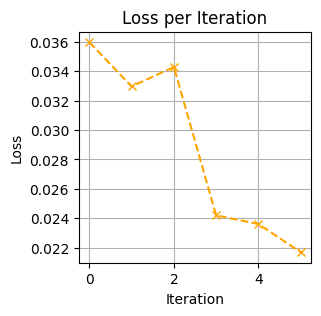

In [59]:
plt.plot(loss_list, label='Test', linestyle='--', marker='x', color='orange')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

### 16개 개별비교

In [60]:
def visualize_patches_total(X, y, X_hat):

    fig, axes = plt.subplots(3, 16, figsize=(32, 6))  # 3행 16열로 설정
    fig.suptitle("Patches", fontsize=12, y=1.05)  # 전체 제목 추가

    for i in range(X.shape[0]):  # 16개의 이미지만큼 반복
        # X 데이터 시각화
        axes[0, i].imshow(X[i], cmap='gray', vmin=-200, vmax=300)
        axes[0, i].axis('off')
        axes[0, i].set_title(f"X {i+1}", fontsize=12)
        
        # y 데이터 시각화
        axes[1, i].imshow(y[i], cmap='gray', vmin=-200, vmax=300)
        axes[1, i].axis('off')
        axes[1, i].set_title(f"y {i+1}", fontsize=12)
        
        # X_hat 데이터 시각화
        axes[2, i].imshow(X_hat[i], cmap='gray', vmin=-200, vmax=300)
        axes[2, i].axis('off')
        axes[2, i].set_title(f"X_hat {i+1}", fontsize=12)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)  # 제목 위치 조정
    plt.show()


In [61]:
# 1. 랜덤비교

test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=0)
test_iter = iter(test_loader)
len(test_iter)

6025

In [62]:
idx = 400 # 1~6025 여기 안에서 선택
for i in range(idx):
    X_test, y_test = next(test_iter)
    
X = np.squeeze(X_test.cpu().numpy()) * 500 - 500
y = np.squeeze(y_test.cpu().numpy()) * 500 - 500
X_hat = np.squeeze(model(X_test.cuda()).cpu().detach()).numpy() * 500 - 500

In [63]:
X.shape, y.shape, X_hat.shape

((16, 55, 55), (16, 55, 55), (16, 55, 55))

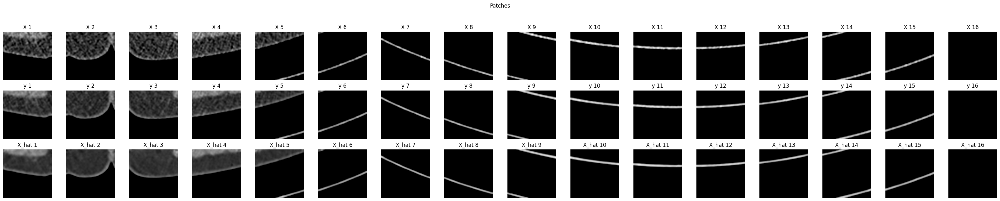

In [64]:
visualize_patches_total(X, y, X_hat)

In [65]:
# 2. 가장 loss가 낮은 값 확인

X_test,y_test,X_hat = best

X = np.squeeze(X_test.cpu().numpy()) * 500 - 500
y = np.squeeze(y_test.cpu().numpy()) * 500 - 500
X_hat = np.squeeze(model(X_test.cuda()).cpu().detach()).numpy() * 500 - 500

In [66]:
X.shape, y.shape, X_hat.shape

((16, 55, 55), (16, 55, 55), (16, 55, 55))

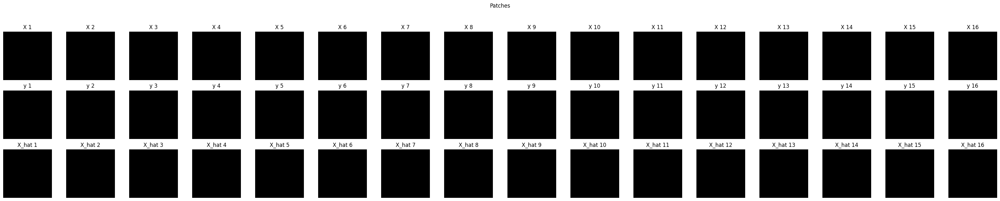

In [67]:
visualize_patches_total(X, y, X_hat)

In [68]:
# 3. 가장 loss가 높은 값 확인

X_test,y_test,X_hat = worst

X = np.squeeze(X_test.cpu().numpy()) * 500 - 500
y = np.squeeze(y_test.cpu().numpy()) * 500 - 500
X_hat = np.squeeze(model(X_test.cuda()).cpu().detach()).numpy() * 500 - 500

In [69]:
X.shape, y.shape, X_hat.shape

((16, 55, 55), (16, 55, 55), (16, 55, 55))

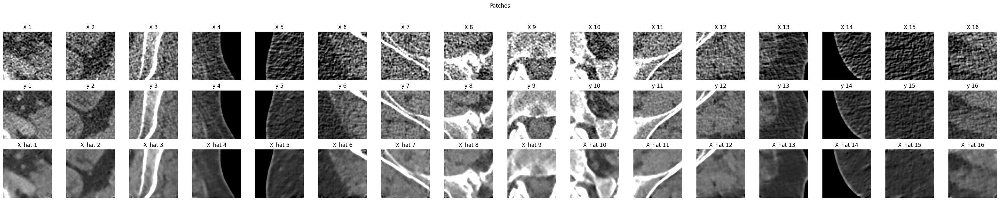

In [70]:
visualize_patches_total(X, y, X_hat)

## batch size = 81

In [71]:
criterion = nn.MSELoss()
interval = 1000

# 저장된 모델 로드
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RedCNNWithChannelAttention().to(device)
model.load_state_dict(torch.load('red_cnn_C_A.pth'))

<All keys matched successfully>

In [72]:
test_loader = DataLoader(test_dataset, batch_size=81, shuffle=False, num_workers=0)
len(test_loader)

1190

In [73]:
# evaluate부분 + top10 best&worst
model.eval()
running_loss = 0.0
loss_list = []
total_loss = 0
best_loss = np.inf
worst_loss = -np.inf

with torch.no_grad():
    for i, data in tqdm(enumerate(test_loader), total=len(test_loader), desc=f"Evaluating"):
        X, y = data[0].to(device), data[1].to(device)
        X_hat = model(X)
        loss = criterion(X_hat, y)

        if loss < best_loss:
            best_loss = loss
            best = (X,y,X_hat)
        if loss > worst_loss:
            worst_loss = loss
            worst = (X,y,X_hat)

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

Evaluating:  84%|████████▍ | 1005/1190 [00:20<00:03, 47.47it/s]

train loss : 0.15267410761490463


Evaluating: 100%|██████████| 1190/1190 [00:24<00:00, 47.87it/s]


### 함수정의

In [74]:
def reconstruct_image(prediction, num_patches_per_row=9, patch_size=55):
    # prediction: (81, 1, 55, 55) 크기의 torch 텐서
    num_patches = prediction.shape[0]  # 81개의 패치
    assert prediction.shape == (81, 1, 55, 55) # "패치의 크기가 올바르지 않습니다."
    
    # 최종적으로 1x495x495 크기의 이미지를 만들기 위한 초기화
    final_image = torch.zeros(1, num_patches_per_row * patch_size, num_patches_per_row * patch_size)
    
    # 9x9 배열로 패치 붙이기
    for i in range(num_patches):
        row = i // num_patches_per_row  # 현재 패치의 행 번호
        col = i % num_patches_per_row   # 현재 패치의 열 번호
        
        # 패치를 해당 위치에 붙이기
        final_image[:, 
                    row * patch_size:(row + 1) * patch_size, 
                    col * patch_size:(col + 1) * patch_size] = prediction[i, 0]

    return final_image

In [75]:
def extract_patches(img, patch_size=55, interval=55):
    patches = []
    _, height, width = img.shape
    for y in range(0, height - patch_size + 1, interval):
        for x in range(0, width - patch_size + 1, interval):
            patch = img[:, y:y + patch_size, x:x + patch_size]
            patches.append(patch)
    patches = torch.stack(patches)  # 리스트를 텐서로 변환
    return patches  # 반환 형태는 patch 수 x 1 x 55 x 55

In [76]:
def rescale(img):
    return img*500-500 # -1000부터 2000의 값으로 다시 변환

In [77]:
def trans_img(X):
    return rescale(np.squeeze(reconstruct_image(X)))

In [78]:
X_test,y_test,X_hat = best
trans_img(X_test).min(), trans_img(X_test).max()

(tensor(-1024.), tensor(1862.))

In [79]:
trans_img(X_test).shape

torch.Size([495, 495])

In [80]:
!pwd

/root/code/redcnn/attention_channel


In [81]:
def save_img(X_test, X_hat, y_test, s):
    # X_test 저장
    numpy_X_test = trans_img(X_test).numpy()
    np.save(f'X_test_image{s}.npy', numpy_X_test)
    
    # X_hat 저장
    numpy_X_hat = trans_img(X_hat).numpy()
    np.save(f'X_hat_image{s}.npy', numpy_X_hat)
    
    # y_test 저장
    numpy_y_test = trans_img(y_test).numpy()
    np.save(f'y_test_image{s}.npy', numpy_y_test)

### 1. best

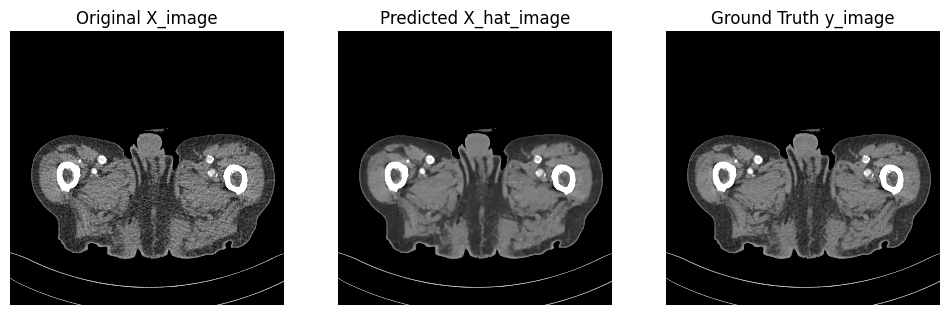

In [82]:
# 1. 가장 좋은 값 가져오기
X_test,y_test,X_hat = best

# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
axes[1].imshow(trans_img(X_hat), cmap='gray', vmin=-200, vmax=300)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
axes[2].imshow(trans_img(y_test), cmap='gray', vmin=-200, vmax=300)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

In [83]:
# 이미지 저장

save_img(X_test, X_hat, y_test, 'best')

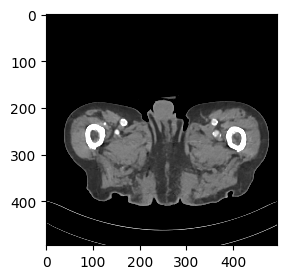

In [84]:
# 불러오기

import numpy as np

s = 'best'
X_test = np.load(f'X_hat_image{s}.npy')

plt.imshow(X_test, cmap='gray', vmin=-200, vmax=300)

### 2. worst

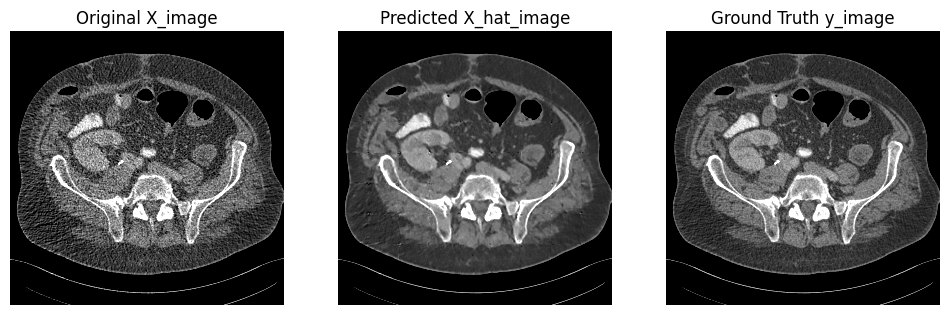

In [85]:
# 2. 가장 나쁜 값 가져오기
X_test,y_test,X_hat = worst

# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
axes[1].imshow(trans_img(X_hat), cmap='gray', vmin=-200, vmax=300)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
axes[2].imshow(trans_img(y_test), cmap='gray', vmin=-200, vmax=300)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

In [86]:
# 이미지 저장

save_img(X_test, X_hat, y_test, 'worst')

### 3. 랜덤

In [87]:
import glob
# 3. 랜덤선택

i,j = 0,0
X_dir = sorted(glob.glob(f'/root/Mayo2016/{L_list[i]}/{data_label[0]}/*.IMA'))[j]
y_dir = sorted(glob.glob(f'/root/Mayo2016/{L_list[i]}/{data_label[1]}/*.IMA'))[j]

X_image, y_image = normlize(X_dir), normlize(y_dir)
X_patches = extract_patches(torch.from_numpy(X_image))

X_image.shape, y_image.shape, X_patches.shape

((1, 512, 512), (1, 512, 512), torch.Size([81, 1, 55, 55]))

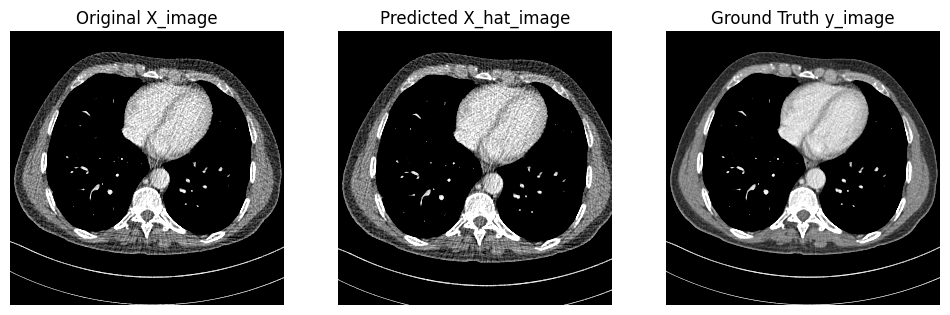

In [88]:
# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
axes[0].imshow(rescale(np.squeeze(X_image)), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
axes[1].imshow(rescale(np.squeeze(reconstruct_image(X_patches))), cmap='gray', vmin=-200, vmax=300)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
axes[2].imshow(rescale(np.squeeze(y_image)), cmap='gray', vmin=-200, vmax=300)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

In [89]:
!pwd

/root/code/redcnn/attention_channel


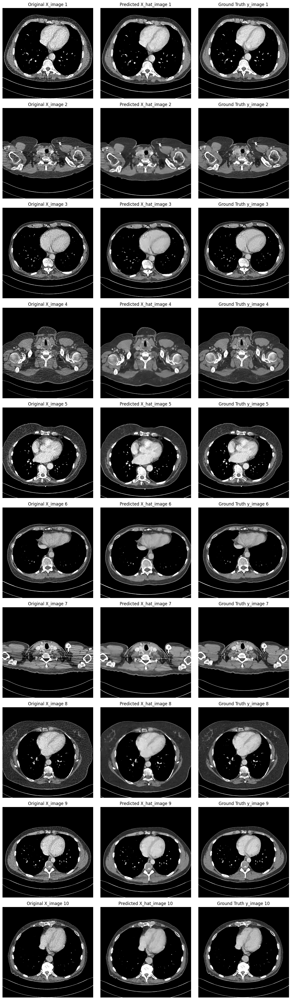

In [90]:
import matplotlib.pyplot as plt
import numpy as np

i, n = 0, 10
L = L_list[i]

# 전체 이미지 배열을 생성
fig, axes = plt.subplots(n, 3, figsize=(12, 4 * n))

for i in range(n):
    X_dir = sorted(glob.glob(f'/root/Mayo2016/{L_list[i]}/{data_label[0]}/*.IMA'))[j]
    y_dir = sorted(glob.glob(f'/root/Mayo2016/{L_list[i]}/{data_label[1]}/*.IMA'))[j]
    X_image, y_image = normlize(X_dir), normlize(y_dir)
    X_patches = extract_patches(torch.from_numpy(X_image))
    X_hat_patches = model(X_patches.cuda()).cpu().detach()
    reconstructed_image = reconstruct_image(X_hat_patches)

    # X_image 표시
    axes[i, 0].imshow(rescale(np.squeeze(X_image)), cmap='gray', vmin=-200, vmax=300)
    axes[i, 0].set_title(f"Original X_image {i+1}")
    axes[i, 0].axis('off')

    # X_hat_image 표시
    axes[i, 1].imshow(rescale(np.squeeze(reconstructed_image)), cmap='gray', vmin=-200, vmax=300)
    axes[i, 1].set_title(f"Predicted X_hat_image {i+1}")
    axes[i, 1].axis('off')

    # y_image 표시
    axes[i, 2].imshow(rescale(np.squeeze(y_image)), cmap='gray', vmin=-200, vmax=300)
    axes[i, 2].set_title(f"Ground Truth y_image {i+1}")
    axes[i, 2].axis('off')

# 모든 이미지 저장
plt.tight_layout()
plt.savefig("comparison_images.png", format="png")  # 한번에 저장
plt.show()  # 모든 이미지 표시

# attention 확인

In [188]:
!pwd

/root/code/redcnn/attention_spatial


In [189]:
%cd /root/code/redcnn/attention_channel/

/root/code/redcnn/attention_channel


In [190]:
# 모델 정의
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RedCNNWithChannelAttention().to(device)

# 저장된 가중치 로드
model.load_state_dict(torch.load('red_cnn_C_A.pth'))
model.eval()

RedCNNWithChannelAttention(
  (conv1): Conv2d(1, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv3): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv4): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv5): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (attention2): SEBlock(
    (avg_pool): AdaptiveAvgPool2d(output_size=1)
    (fc): Sequential(
      (0): Linear(in_features=96, out_features=6, bias=False)
      (1): ReLU(inplace=True)
      (2): Linear(in_features=6, out_features=96, bias=False)
      (3): Sigmoid()
    )
  )
  (attention3): SEBlock(
    (avg_pool): AdaptiveAvgPool2d(output_size=1)
    (fc): Sequential(
      (0): Linear(in_features=96, out_features=6, bias=False)
      (1): ReLU(inplace=True)
      (2): Linear(in_features=6, out_features=96, bias=False)
      (3): Sigmoid()
    )
  )
  (deconv1): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv2): ConvTranspose2d(96, 9

## best / worst 이미지의 attention 확인

### 1. best

In [191]:
X_test,y_test,X_hat = best
X_test.shape

torch.Size([81, 1, 55, 55])

In [192]:
X_test.to(device)
output = model(X_test)

In [193]:
# Forward Pass
output = model(X_test)

model.attention2.last_attention.shape

torch.Size([81, 96, 1, 1])

In [194]:
import numpy as np

# Attention Weight 가져오기 (예: 첫 번째 SEBlock)
attention_weights2 = model.attention2.last_attention.squeeze().cpu().detach().numpy()  # [81, 96]
attention_weights3 = model.attention3.last_attention.squeeze().cpu().detach().numpy()

# 배치 차원에서 평균 계산
mean_attention_weights2 = np.mean(attention_weights2, axis=0)  # [96]
mean_attention_weights3 = np.mean(attention_weights3, axis=0)  # [96]

mean_attention_weights2.shape, mean_attention_weights3.shape

((96,), (96,))

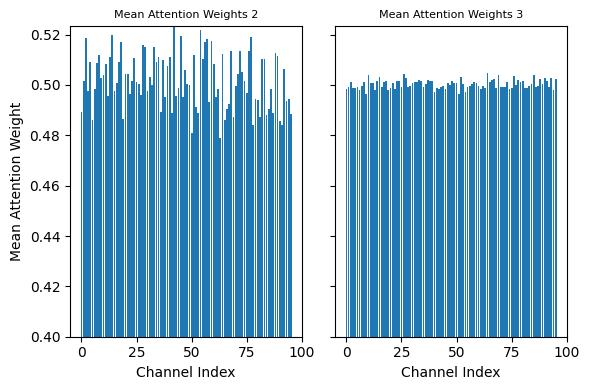

In [200]:
# 배치 차원에서 평균 계산
mean_attention_weights2 = np.mean(attention_weights2, axis=0)  # [96]
mean_attention_weights3 = np.mean(attention_weights3, axis=0)  # [96]

# y축 최소값 설정
y_min = 0.4  # 변경 가능

# y축 최대값 계산 (공통 최대값)
y_max = max(mean_attention_weights2.max(), mean_attention_weights3.max())

# Subplot 설정
fig, axes = plt.subplots(1, 2, figsize=(6, 4), sharey=True)

# 첫 번째 subplot
axes[0].bar(range(len(mean_attention_weights2)), mean_attention_weights2)
axes[0].set_title("Mean Attention Weights 2", fontsize=8)
axes[0].set_xlabel("Channel Index")
axes[0].set_ylabel("Mean Attention Weight")
axes[0].set_ylim(y_min, y_max)  # 공통 최대값 사용

# 두 번째 subplot
axes[1].bar(range(len(mean_attention_weights3)), mean_attention_weights3)
axes[1].set_title("Mean Attention Weights 3", fontsize=8)
axes[1].set_xlabel("Channel Index")
axes[1].set_ylim(y_min, y_max)  # 공통 최대값 사용

# 레이아웃 조정 및 표시
plt.tight_layout()
plt.show()


In [201]:
# # 배치 차원에서 평균 계산
# mean_attention_weights2 = np.mean(attention_weights2, axis=0)  # [96]
# mean_attention_weights3 = np.mean(attention_weights3, axis=0)  # [96]

# # Threshold 설정
# threshold = 0

# # Threshold를 넘는 채널만 필터링
# indices2 = np.where(mean_attention_weights2 > threshold)[0]
# weights2 = mean_attention_weights2[indices2]

# indices3 = np.where(mean_attention_weights3 > threshold)[0]
# weights3 = mean_attention_weights3[indices3]

# # Subplot 설정
# fig, axes = plt.subplots(1, 2, figsize=(6, 4), sharey=True)

# # 첫 번째 subplot
# axes[0].bar(indices2, weights2)
# axes[0].set_title(f"Mean Attention Weights 2 (Threshold > {threshold})", fontsize=8)
# axes[0].set_xlabel("Channel Index")
# axes[0].set_ylabel("Mean Attention Weight")

# # 두 번째 subplot
# axes[1].bar(indices3, weights3)
# axes[1].set_title(f"Mean Attention Weights 3 (Threshold > {threshold})", fontsize=8)
# axes[1].set_xlabel("Channel Index")

# # 레이아웃 조정 및 표시
# plt.tight_layout()
# plt.show()

In [97]:
from decimal import Decimal

# attention2의 mean과 sd 계산
mean2 = Decimal(str(np.mean(mean_attention_weights2))).quantize(Decimal('0.001'))
sd2 = Decimal(str(np.sqrt(np.var(mean_attention_weights2)))).quantize(Decimal('0.001'))

# attention3의 mean과 sd 계산
mean3 = Decimal(str(np.mean(mean_attention_weights3))).quantize(Decimal('0.001'))
sd3 = Decimal(str(np.sqrt(np.var(mean_attention_weights3)))).quantize(Decimal('0.001'))

# 출력
print(f"Attention 2 - mean: {mean2}, sd: {sd2}")
print(f"Attention 3 - mean: {mean3}, sd: {sd3}")

Attention 2 - mean: 0.502, sd: 0.011
Attention 3 - mean: 0.500, sd: 0.002


### 2. worst

In [203]:
X_test,y_test,X_hat = worst
X_test.shape

torch.Size([81, 1, 55, 55])

In [204]:
X_test.to(device)
output = model(X_test)

In [205]:
# Forward Pass
output = model(X_test)

model.attention2.last_attention.shape

torch.Size([81, 96, 1, 1])

In [206]:
import numpy as np

# Attention Weight 가져오기 (예: 첫 번째 SEBlock)
attention_weights2 = model.attention2.last_attention.squeeze().cpu().detach().numpy()  # [81, 96]
attention_weights3 = model.attention3.last_attention.squeeze().cpu().detach().numpy()

# 배치 차원에서 평균 계산
mean_attention_weights2 = np.mean(attention_weights2, axis=0)  # [96]
mean_attention_weights3 = np.mean(attention_weights3, axis=0)  # [96]

mean_attention_weights2.shape, mean_attention_weights3.shape

((96,), (96,))

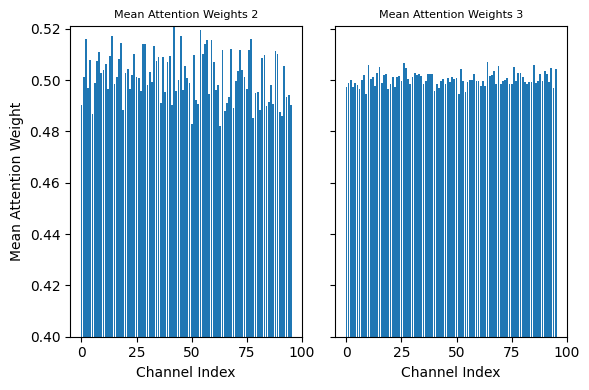

In [207]:
# 배치 차원에서 평균 계산
mean_attention_weights2 = np.mean(attention_weights2, axis=0)  # [96]
mean_attention_weights3 = np.mean(attention_weights3, axis=0)  # [96]

# y축 최소값 설정
y_min = 0.4  # 변경 가능

# y축 최대값 계산 (공통 최대값)
y_max = max(mean_attention_weights2.max(), mean_attention_weights3.max())

# Subplot 설정
fig, axes = plt.subplots(1, 2, figsize=(6, 4), sharey=True)

# 첫 번째 subplot
axes[0].bar(range(len(mean_attention_weights2)), mean_attention_weights2)
axes[0].set_title("Mean Attention Weights 2", fontsize=8)
axes[0].set_xlabel("Channel Index")
axes[0].set_ylabel("Mean Attention Weight")
axes[0].set_ylim(y_min, y_max)  # 공통 최대값 사용

# 두 번째 subplot
axes[1].bar(range(len(mean_attention_weights3)), mean_attention_weights3)
axes[1].set_title("Mean Attention Weights 3", fontsize=8)
axes[1].set_xlabel("Channel Index")
axes[1].set_ylim(y_min, y_max)  # 공통 최대값 사용

# 레이아웃 조정 및 표시
plt.tight_layout()
plt.show()

In [208]:
from decimal import Decimal

# attention2의 mean과 sd 계산
mean2 = Decimal(str(np.mean(mean_attention_weights2))).quantize(Decimal('0.001'))
sd2 = Decimal(str(np.sqrt(np.var(mean_attention_weights2)))).quantize(Decimal('0.001'))

# attention3의 mean과 sd 계산
mean3 = Decimal(str(np.mean(mean_attention_weights3))).quantize(Decimal('0.001'))
sd3 = Decimal(str(np.sqrt(np.var(mean_attention_weights3)))).quantize(Decimal('0.001'))

# 출력
print(f"Attention 2 - mean: {mean2}, sd: {sd2}")
print(f"Attention 3 - mean: {mean3}, sd: {sd3}")

Attention 2 - mean: 0.502, sd: 0.009
Attention 3 - mean: 0.500, sd: 0.003


## 결론
잘나올수록 attention이 마지막 layer에서 더 차등이 크다. 그러니까 마지막 layer에서 attention이 더 효과가 있을수록 좋은 성능을 보인 것이다.

# attention모델2; Spatial Attention

In [104]:
import torch
import torch.nn as nn

class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()
        assert kernel_size in (3, 7), "Kernel size must be 3 or 7"
        padding = (kernel_size - 1) // 2 # 동일한 크기를 유지하기 위한 패딩
        self.conv = nn.Conv2d(2, 1, kernel_size=kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()
        self.last_attention = None  # Attention 값을 저장하는 변수

    def forward(self, x):
        # 채널 차원을 압축 (Max Pooling과 Average Pooling)
        avg_out = torch.mean(x, dim=1, keepdim=True) # Average pooling
        max_out, _ = torch.max(x, dim=1, keepdim=True) # Max pooling
        combined = torch.cat([avg_out, max_out], dim=1) # 채널 차원에서 결합
        # 2D Convolution 적용
        attention = self.sigmoid(self.conv(combined)) # [B, 1, H, W]
        self.last_attention = attention  # Attention 값을 저장
        return x * attention

## SpatialAttention 살펴보기

In [105]:
# 입력 텐서: [batch, channels, height, width]
x = torch.rand(16, 64, 32, 32)  # Batch size=16, Channels=64, Height=32, Width=32

# Spatial Attention 적용
spatial_attention = SpatialAttention(kernel_size=7)
output = spatial_attention(x)

print(f"Input shape: {x.shape}")        # [16, 64, 32, 32]
print(f"Output shape: {output.shape}")  # [16, 64, 32, 32]


Input shape: torch.Size([16, 64, 32, 32])
Output shape: torch.Size([16, 64, 32, 32])


In [106]:
conv_layer = nn.Conv2d(1, 96, 5, 1, 0)
conv_layer(X_train).shape

torch.Size([16, 96, 51, 51])

In [107]:
conv_v = conv_layer(X_train)
x = conv_v
avg_out = torch.mean(x, dim=1, keepdim=True)  # Average pooling
max_out, _ = torch.max(x, dim=1, keepdim=True)  # Max pooling
combined = torch.cat([avg_out, max_out], dim=1)
conv_v.shape, avg_out.shape, max_out.shape, combined.shape

(torch.Size([16, 96, 51, 51]),
 torch.Size([16, 1, 51, 51]),
 torch.Size([16, 1, 51, 51]),
 torch.Size([16, 2, 51, 51]))

In [108]:
padding = (7 - 1) // 2  # 동일한 크기를 유지하기 위한 패딩
conv_layer2 = nn.Conv2d(2, 1, kernel_size=7, padding=padding, bias=False)

conv_layer2(combined).shape

torch.Size([16, 1, 51, 51])

In [109]:
sigmoid = nn.Sigmoid()
output = sigmoid(conv_layer2(combined))
output.shape

torch.Size([16, 1, 51, 51])

In [110]:
output[0].shape

torch.Size([1, 51, 51])

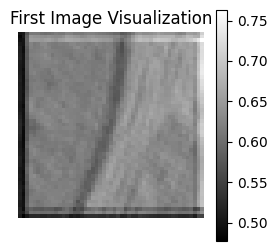

In [111]:
import matplotlib.pyplot as plt

# Output 텐서 (torch.Size([16, 1, 51, 51]))
# 예: output 텐서가 존재한다고 가정
first_image = output[0, 0, :, :]  # 첫 번째 배치의 첫 번째 채널 선택

# 텐서를 NumPy 배열로 변환
first_image_np = first_image.detach().cpu().numpy()  # GPU 텐서일 경우 .cpu() 사용

# 시각화
plt.imshow(first_image_np, cmap='gray')
plt.colorbar()
plt.title("First Image Visualization")
plt.axis('off')
plt.show()

## 모델구현

2개의 attention을 앞단의 중간과 마지막 부분에 각각 설치

In [112]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [113]:
class RedCNNWithSpatialAttention(nn.Module):
    def __init__(self):
        super(RedCNNWithSpatialAttention, self).__init__()

        # 인코더 부분
        self.conv1 = nn.Conv2d(1, 96, 5, 1, 0)
        self.conv2 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv3 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv4 = nn.Conv2d(96, 96, 5, 1, 0)
        self.conv5 = nn.Conv2d(96, 96, 5, 1, 0)

        # Spatial Attention Blocks
        self.spatial_attention3 = SpatialAttention()
        self.spatial_attention5 = SpatialAttention()

        # 디코더 부분
        self.deconv1 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv2 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv3 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv4 = nn.ConvTranspose2d(96, 96, 5, 1, 0)
        self.deconv_last = nn.ConvTranspose2d(96, 1, 5, 1, 0)

        self.relu = nn.ReLU()

    def forward(self, x):
        # 인코더 부분
        residual1 = x
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        residual2 = x
        x = self.relu(self.conv3(x))
        x = self.spatial_attention3(x)  # Spatial Attention (3번째 위치)
        x = self.relu(self.conv4(x))
        residual3 = x
        x = self.relu(self.conv5(x))
        x = self.spatial_attention5(x)  # Spatial Attention (5번째 위치)

        # 디코더 부분
        x = self.relu(self.deconv1(x) + residual3)
        x = self.relu(self.deconv2(x))
        x = self.relu(self.deconv3(x) + residual2)
        x = self.relu(self.deconv4(x))
        x = self.deconv_last(x) + residual1

        return x

In [114]:
model = RedCNNWithSpatialAttention().to(device)
model


RedCNNWithSpatialAttention(
  (conv1): Conv2d(1, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv3): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv4): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv5): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (spatial_attention3): SpatialAttention(
    (conv): Conv2d(2, 1, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
    (sigmoid): Sigmoid()
  )
  (spatial_attention5): SpatialAttention(
    (conv): Conv2d(2, 1, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
    (sigmoid): Sigmoid()
  )
  (deconv1): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv2): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv3): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv4): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv_last): ConvTranspose2d(96, 1, kernel_size=(5, 5), st

In [115]:
%cd /root/code

import utils.EarlyStopping
import utils.LRScheduler
import utils.train_eval_util
import importlib
importlib.reload(utils.EarlyStopping)
importlib.reload(utils.LRScheduler)
importlib.reload(utils.train_eval_util)

/root/code


<module 'utils.train_eval_util' from '/root/code/utils/train_eval_util.py'>

In [116]:
import torch.nn as nn
criterion = nn.MSELoss()

from utils.EarlyStopping import *
from utils.LRScheduler import *
from utils.train_eval_util import train, evaluate

learning_rate = 1e-5
optimizer = torch.optim.Adam(params = model.parameters(),
                             lr = learning_rate)


early_stopping = EarlyStopping(patience = 7, # 7번까지는 개선이 안되어도 봐준다.
                               min_delta = 1e-5) # 이정도는 개선이 되어야한다. 아니면 위의 patience까지 count하다가 stop


scheduler = LRScheduler(optimizer = optimizer,
                        patience = 5,
                        min_lr = 1e-10,
                        factor = 0.5)

In [117]:
import torch
from tqdm import tqdm

interval = 1000

def train(model, train_loader, optimizer, criterion, device, epoch):
    model.train()
    running_loss = 0.0
    loss_list = []
    total_loss = 0

    for i, data in tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch} - Training"):
        X, y = data[0].to(device), data[1].to(device)
        optimizer.zero_grad()
        X_hat = model(X)
        loss = criterion(X_hat, y)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

    return loss_list, total_loss / len(train_loader.dataset)

def evaluate(model, loader, criterion, device, epoch):
    model.eval()
    running_loss = 0.0
    loss_list = []
    total_loss = 0

    with torch.no_grad():
        for i, data in tqdm(enumerate(loader), total=len(loader), desc=f"Epoch {epoch} - Evaluating"):
            X, y = data[0].to(device), data[1].to(device)
            X_hat = model(X)
            loss = criterion(X_hat, y)

            running_loss += loss.item() * X.size(0)

            if i % interval == interval-1:
                interval_loss = running_loss / interval
                loss_list.append(interval_loss)
                total_loss += running_loss
                running_loss = 0.0
                tqdm.write(f'train loss : {interval_loss}')

    return loss_list, total_loss / len(loader.dataset)

# 학습

In [118]:
!pwd

/root/code


In [119]:
%cd /root/code/redcnn/attention_spatial

/root/code/redcnn/attention_spatial


In [120]:
epochs = 2 # 각 epoch마다 train(20분), valid(2분)이 소요된다.
best_valid_loss = float('inf')
train_loss_per_iter = []
train_loss_per_epoch = []
val_loss_per_iter = []
val_loss_per_epoch = []

for epoch in range(epochs):
    loss_list, total_loss = train(model, train_loader, optimizer, criterion, device, epoch)
    train_loss_per_iter.append(loss_list)
    train_loss_per_epoch.append(total_loss)

    loss_list, total_loss = evaluate(model, val_loader, criterion, device, epoch)
    val_loss_per_iter.append(loss_list)
    val_loss_per_epoch.append(total_loss)

    print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {train_loss_per_epoch[-1]:.4f}, Valid Loss: {val_loss_per_epoch[-1]:.4f}")

    valid_loss = val_loss_per_epoch[-1]
    scheduler(valid_loss)

    if (early_stopping(valid_loss)):
        break

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        epochs_no_improve = 0
        torch.save(model.state_dict(), "./" + 'red_cnn_S_A' + ".pth")

Epoch 0 - Training:   2%|▏         | 1006/57596 [00:20<19:41, 47.88it/s]

train loss : 0.08098650878667832


Epoch 0 - Training:   3%|▎         | 2006/57596 [00:41<19:20, 47.92it/s]

train loss : 0.057462140407413244


Epoch 0 - Training:   5%|▌         | 3006/57596 [01:02<19:00, 47.87it/s]

train loss : 0.05436495302058757


Epoch 0 - Training:   7%|▋         | 4006/57596 [01:23<18:38, 47.91it/s]

train loss : 0.05138512476161122


Epoch 0 - Training:   9%|▊         | 5006/57596 [01:43<18:17, 47.92it/s]

train loss : 0.0489831971116364


Epoch 0 - Training:  10%|█         | 6006/57596 [02:04<17:56, 47.94it/s]

train loss : 0.04779200989194214


Epoch 0 - Training:  12%|█▏        | 7006/57596 [02:25<17:38, 47.79it/s]

train loss : 0.04655133312381804


Epoch 0 - Training:  14%|█▍        | 8006/57596 [02:46<17:16, 47.86it/s]

train loss : 0.04531777082756162


Epoch 0 - Training:  16%|█▌        | 9006/57596 [03:06<16:54, 47.90it/s]

train loss : 0.04546201454475522


Epoch 0 - Training:  17%|█▋        | 10006/57596 [03:27<16:34, 47.86it/s]

train loss : 0.04398598356358707


Epoch 0 - Training:  19%|█▉        | 11006/57596 [03:48<16:10, 48.03it/s]

train loss : 0.04305739925429225


Epoch 0 - Training:  21%|██        | 12006/57596 [04:08<15:51, 47.90it/s]

train loss : 0.04319506106711924


Epoch 0 - Training:  23%|██▎       | 13006/57596 [04:29<15:28, 48.00it/s]

train loss : 0.042281214328482745


Epoch 0 - Training:  24%|██▍       | 14006/57596 [04:50<15:08, 47.99it/s]

train loss : 0.04166776862181723


Epoch 0 - Training:  26%|██▌       | 15006/57596 [05:11<14:47, 47.99it/s]

train loss : 0.04145055112987757


Epoch 0 - Training:  28%|██▊       | 16006/57596 [05:31<14:26, 47.98it/s]

train loss : 0.0416548412386328


Epoch 0 - Training:  30%|██▉       | 17006/57596 [05:52<14:05, 47.99it/s]

train loss : 0.041195196479558945


Epoch 0 - Training:  31%|███▏      | 18006/57596 [06:13<13:45, 47.96it/s]

train loss : 0.04067383667454123


Epoch 0 - Training:  33%|███▎      | 19006/57596 [06:33<13:19, 48.29it/s]

train loss : 0.04114090804196894


Epoch 0 - Training:  35%|███▍      | 20006/57596 [06:54<13:00, 48.16it/s]

train loss : 0.039962763160467145


Epoch 0 - Training:  36%|███▋      | 21006/57596 [07:15<12:37, 48.33it/s]

train loss : 0.04013248540647328


Epoch 0 - Training:  38%|███▊      | 22006/57596 [07:35<12:22, 47.96it/s]

train loss : 0.04033459062501788


Epoch 0 - Training:  40%|███▉      | 23006/57596 [07:56<12:00, 47.98it/s]

train loss : 0.03897197544761002


Epoch 0 - Training:  42%|████▏     | 24006/57596 [08:17<11:39, 48.05it/s]

train loss : 0.039315958904102444


Epoch 0 - Training:  43%|████▎     | 25006/57596 [08:37<11:19, 47.94it/s]

train loss : 0.03860831808485091


Epoch 0 - Training:  45%|████▌     | 26006/57596 [08:58<10:57, 48.06it/s]

train loss : 0.038587357241660354


Epoch 0 - Training:  47%|████▋     | 27006/57596 [09:19<10:37, 48.02it/s]

train loss : 0.03928529221005738


Epoch 0 - Training:  49%|████▊     | 28006/57596 [09:39<10:17, 47.94it/s]

train loss : 0.03841822213865816


Epoch 0 - Training:  50%|█████     | 29006/57596 [10:00<09:55, 47.99it/s]

train loss : 0.038959405560046435


Epoch 0 - Training:  52%|█████▏    | 30006/57596 [10:21<09:34, 48.02it/s]

train loss : 0.038420058995485305


Epoch 0 - Training:  54%|█████▍    | 31006/57596 [10:41<09:13, 48.07it/s]

train loss : 0.03875920003652573


Epoch 0 - Training:  56%|█████▌    | 32006/57596 [11:02<08:51, 48.11it/s]

train loss : 0.038486553639173506


Epoch 0 - Training:  57%|█████▋    | 33006/57596 [11:23<08:31, 48.04it/s]

train loss : 0.038000204840675


Epoch 0 - Training:  59%|█████▉    | 34006/57596 [11:43<08:11, 47.99it/s]

train loss : 0.03839272040687501


Epoch 0 - Training:  61%|██████    | 35006/57596 [12:04<07:49, 48.07it/s]

train loss : 0.03822484789602459


Epoch 0 - Training:  63%|██████▎   | 36006/57596 [12:25<07:29, 48.02it/s]

train loss : 0.03789792171865702


Epoch 0 - Training:  64%|██████▍   | 37006/57596 [12:45<07:08, 48.00it/s]

train loss : 0.037977732607163486


Epoch 0 - Training:  66%|██████▌   | 38006/57596 [13:06<06:48, 47.99it/s]

train loss : 0.038156191939488056


Epoch 0 - Training:  68%|██████▊   | 39006/57596 [13:27<06:27, 48.03it/s]

train loss : 0.03837835768610239


Epoch 0 - Training:  69%|██████▉   | 40006/57596 [13:47<06:06, 48.01it/s]

train loss : 0.037863963641226295


Epoch 0 - Training:  71%|███████   | 41006/57596 [14:08<05:45, 47.97it/s]

train loss : 0.03827071145549416


Epoch 0 - Training:  73%|███████▎  | 42006/57596 [14:29<05:25, 47.95it/s]

train loss : 0.03758839671686292


Epoch 0 - Training:  75%|███████▍  | 43006/57596 [14:49<05:04, 47.98it/s]

train loss : 0.03820059539750218


Epoch 0 - Training:  76%|███████▋  | 44006/57596 [15:10<04:42, 48.04it/s]

train loss : 0.037554756850004194


Epoch 0 - Training:  78%|███████▊  | 45006/57596 [15:31<04:22, 47.95it/s]

train loss : 0.03766302479058504


Epoch 0 - Training:  80%|███████▉  | 46006/57596 [15:52<04:01, 47.96it/s]

train loss : 0.03762003223225474


Epoch 0 - Training:  82%|████████▏ | 47006/57596 [16:12<03:40, 48.00it/s]

train loss : 0.03719888388551772


Epoch 0 - Training:  83%|████████▎ | 48006/57596 [16:33<03:18, 48.26it/s]

train loss : 0.03722269082907587


Epoch 0 - Training:  85%|████████▌ | 49006/57596 [16:54<02:58, 48.03it/s]

train loss : 0.037111369190737604


Epoch 0 - Training:  87%|████████▋ | 50006/57596 [17:14<02:38, 47.99it/s]

train loss : 0.03694826691225171


Epoch 0 - Training:  89%|████████▊ | 51006/57596 [17:35<02:17, 48.00it/s]

train loss : 0.03753985324315727


Epoch 0 - Training:  90%|█████████ | 52006/57596 [17:56<01:56, 48.00it/s]

train loss : 0.037088578848168255


Epoch 0 - Training:  92%|█████████▏| 53006/57596 [18:16<01:35, 48.01it/s]

train loss : 0.03695341159775853


Epoch 0 - Training:  94%|█████████▍| 54006/57596 [18:37<01:14, 48.00it/s]

train loss : 0.0373075750451535


Epoch 0 - Training:  96%|█████████▌| 55006/57596 [18:58<00:53, 47.98it/s]

train loss : 0.03676954066380858


Epoch 0 - Training:  97%|█████████▋| 56006/57596 [19:18<00:33, 47.89it/s]

train loss : 0.03760874291881919


Epoch 0 - Training:  99%|█████████▉| 57006/57596 [19:39<00:12, 48.01it/s]

train loss : 0.03707343010790646


Epoch 0 - Evaluating:  21%|██        | 1014/4815 [00:08<00:31, 119.89it/s]

train loss : 0.04293165363930166


Epoch 0 - Evaluating:  42%|████▏     | 2013/4815 [00:16<00:23, 119.90it/s]

train loss : 0.04625008354149759


Epoch 0 - Evaluating:  63%|██████▎   | 3014/4815 [00:24<00:15, 119.72it/s]

train loss : 0.030772402648348362


Epoch 0 - Evaluating:  83%|████████▎ | 4014/4815 [00:33<00:06, 120.05it/s]

train loss : 0.03419608287746087


Epoch 0 - Evaluating: 100%|██████████| 4815/4815 [00:39<00:00, 120.68it/s]


Epoch [1/2], Train Loss: 0.0025, Valid Loss: 0.0020


Epoch 1 - Training:   2%|▏         | 1008/57596 [00:20<19:34, 48.17it/s]

train loss : 0.03714711285755038


Epoch 1 - Training:   3%|▎         | 2008/57596 [00:41<19:15, 48.12it/s]

train loss : 0.03713426903448999


Epoch 1 - Training:   5%|▌         | 3008/57596 [01:02<18:55, 48.09it/s]

train loss : 0.03680966182332486


Epoch 1 - Training:   7%|▋         | 4008/57596 [01:22<18:34, 48.10it/s]

train loss : 0.03707090788707137


Epoch 1 - Training:   9%|▊         | 5008/57596 [01:43<18:13, 48.08it/s]

train loss : 0.03664861122984439


Epoch 1 - Training:  10%|█         | 6008/57596 [02:03<17:52, 48.11it/s]

train loss : 0.0363313744161278


Epoch 1 - Training:  12%|█▏        | 7008/57596 [02:24<17:30, 48.14it/s]

train loss : 0.0364142231978476


Epoch 1 - Training:  14%|█▍        | 8008/57596 [02:45<17:10, 48.11it/s]

train loss : 0.03683799134008586


Epoch 1 - Training:  16%|█▌        | 9008/57596 [03:05<16:48, 48.18it/s]

train loss : 0.03639345370605588


Epoch 1 - Training:  17%|█▋        | 10008/57596 [03:26<16:28, 48.15it/s]

train loss : 0.03702059717103839


Epoch 1 - Training:  19%|█▉        | 11008/57596 [03:47<16:07, 48.17it/s]

train loss : 0.03597029661945999


Epoch 1 - Training:  21%|██        | 12008/57596 [04:07<15:45, 48.19it/s]

train loss : 0.0359643276501447


Epoch 1 - Training:  23%|██▎       | 13008/57596 [04:28<15:27, 48.09it/s]

train loss : 0.03583297311328351


Epoch 1 - Training:  24%|██▍       | 14008/57596 [04:48<15:05, 48.14it/s]

train loss : 0.03675732796452939


Epoch 1 - Training:  26%|██▌       | 15008/57596 [05:09<14:43, 48.20it/s]

train loss : 0.03649518112279475


Epoch 1 - Training:  28%|██▊       | 16008/57596 [05:30<14:23, 48.17it/s]

train loss : 0.035900136335752904


Epoch 1 - Training:  30%|██▉       | 17008/57596 [05:50<14:02, 48.20it/s]

train loss : 0.03655775699950754


Epoch 1 - Training:  31%|███▏      | 18008/57596 [06:11<13:42, 48.16it/s]

train loss : 0.03584447781182826


Epoch 1 - Training:  33%|███▎      | 19008/57596 [06:32<13:22, 48.10it/s]

train loss : 0.03663133576139808


Epoch 1 - Training:  35%|███▍      | 20008/57596 [06:52<12:59, 48.20it/s]

train loss : 0.03595835501328111


Epoch 1 - Training:  36%|███▋      | 21008/57596 [07:13<12:39, 48.15it/s]

train loss : 0.03550464472174644


Epoch 1 - Training:  38%|███▊      | 22008/57596 [07:33<12:18, 48.18it/s]

train loss : 0.03587806650716811


Epoch 1 - Training:  40%|███▉      | 23008/57596 [07:54<11:58, 48.16it/s]

train loss : 0.035853535246104004


Epoch 1 - Training:  42%|████▏     | 24008/57596 [08:15<11:36, 48.22it/s]

train loss : 0.03605392060801387


Epoch 1 - Training:  43%|████▎     | 25008/57596 [08:35<11:16, 48.18it/s]

train loss : 0.03609756313450634


Epoch 1 - Training:  45%|████▌     | 26008/57596 [08:56<10:55, 48.19it/s]

train loss : 0.03574329574033618


Epoch 1 - Training:  47%|████▋     | 27008/57596 [09:16<10:34, 48.21it/s]

train loss : 0.03609413027949631


Epoch 1 - Training:  49%|████▊     | 28008/57596 [09:37<10:13, 48.20it/s]

train loss : 0.03561584577709436


Epoch 1 - Training:  50%|█████     | 29008/57596 [09:58<09:53, 48.18it/s]

train loss : 0.036318281572312115


Epoch 1 - Training:  52%|█████▏    | 30008/57596 [10:18<09:31, 48.24it/s]

train loss : 0.03548369381763041


Epoch 1 - Training:  54%|█████▍    | 31008/57596 [10:39<09:12, 48.15it/s]

train loss : 0.0353151719365269


Epoch 1 - Training:  56%|█████▌    | 32008/57596 [10:59<08:50, 48.19it/s]

train loss : 0.03625737323239446


Epoch 1 - Training:  57%|█████▋    | 33008/57596 [11:20<08:30, 48.15it/s]

train loss : 0.03606340868212283


Epoch 1 - Training:  59%|█████▉    | 34008/57596 [11:41<08:10, 48.11it/s]

train loss : 0.03570530583150685


Epoch 1 - Training:  61%|██████    | 35008/57596 [12:01<07:49, 48.15it/s]

train loss : 0.03531728650908917


Epoch 1 - Training:  63%|██████▎   | 36008/57596 [12:22<07:27, 48.23it/s]

train loss : 0.035522527303546665


Epoch 1 - Training:  64%|██████▍   | 37008/57596 [12:43<07:07, 48.20it/s]

train loss : 0.035774016492068766


Epoch 1 - Training:  66%|██████▌   | 38008/57596 [13:03<06:46, 48.16it/s]

train loss : 0.03605218123830855


Epoch 1 - Training:  68%|██████▊   | 39008/57596 [13:24<06:25, 48.20it/s]

train loss : 0.03548780989833176


Epoch 1 - Training:  69%|██████▉   | 40008/57596 [13:44<06:04, 48.21it/s]

train loss : 0.03561192858591676


Epoch 1 - Training:  71%|███████   | 41008/57596 [14:05<05:44, 48.20it/s]

train loss : 0.03533181623928249


Epoch 1 - Training:  73%|███████▎  | 42008/57596 [14:26<05:23, 48.18it/s]

train loss : 0.03537538723833859


Epoch 1 - Training:  75%|███████▍  | 43008/57596 [14:46<05:03, 48.13it/s]

train loss : 0.03491778148431331


Epoch 1 - Training:  76%|███████▋  | 44008/57596 [15:07<04:42, 48.11it/s]

train loss : 0.0353711110688746


Epoch 1 - Training:  78%|███████▊  | 45008/57596 [15:27<04:21, 48.19it/s]

train loss : 0.03548609107453376


Epoch 1 - Training:  80%|███████▉  | 46008/57596 [15:48<04:00, 48.16it/s]

train loss : 0.035619207413867114


Epoch 1 - Training:  82%|████████▏ | 47008/57596 [16:09<03:39, 48.13it/s]

train loss : 0.034955861414782706


Epoch 1 - Training:  83%|████████▎ | 48008/57596 [16:29<03:19, 48.17it/s]

train loss : 0.03582776398584247


Epoch 1 - Training:  85%|████████▌ | 49008/57596 [16:50<02:58, 48.16it/s]

train loss : 0.03512424351833761


Epoch 1 - Training:  87%|████████▋ | 50008/57596 [17:10<02:37, 48.13it/s]

train loss : 0.03513913622871041


Epoch 1 - Training:  89%|████████▊ | 51008/57596 [17:31<02:16, 48.17it/s]

train loss : 0.03523590983264148


Epoch 1 - Training:  90%|█████████ | 52008/57596 [17:52<01:55, 48.19it/s]

train loss : 0.035369447380304335


Epoch 1 - Training:  92%|█████████▏| 53008/57596 [18:12<01:35, 48.18it/s]

train loss : 0.03506320049799979


Epoch 1 - Training:  94%|█████████▍| 54008/57596 [18:33<01:14, 48.24it/s]

train loss : 0.035278070248663425


Epoch 1 - Training:  96%|█████████▌| 55008/57596 [18:53<00:53, 48.24it/s]

train loss : 0.03471387259941548


Epoch 1 - Training:  97%|█████████▋| 56008/57596 [19:14<00:33, 48.12it/s]

train loss : 0.0353249526405707


Epoch 1 - Training:  99%|█████████▉| 57008/57596 [19:35<00:12, 48.20it/s]

train loss : 0.03522603770159185


Epoch 1 - Evaluating:  21%|██        | 1014/4815 [00:08<00:31, 120.50it/s]

train loss : 0.04135905622784048


Epoch 1 - Evaluating:  42%|████▏     | 2015/4815 [00:16<00:23, 120.43it/s]

train loss : 0.04418421616172418


Epoch 1 - Evaluating:  63%|██████▎   | 3016/4815 [00:24<00:14, 120.51it/s]

train loss : 0.029422918706201017


Epoch 1 - Evaluating:  83%|████████▎ | 4017/4815 [00:33<00:06, 120.43it/s]

train loss : 0.032623069289606066


Epoch 1 - Evaluating: 100%|██████████| 4815/4815 [00:39<00:00, 121.17it/s]

Epoch [2/2], Train Loss: 0.0022, Valid Loss: 0.0019


In [121]:
!pwd

/root/code/redcnn/attention_spatial


In [122]:
import pickle

data_to_save = {
    'train_loss_per_iter': train_loss_per_iter,
    'val_loss_per_iter': val_loss_per_iter,
    'train_loss_per_epoch': train_loss_per_epoch,
    'val_loss_per_epoch': val_loss_per_epoch
}

for filename, data in data_to_save.items():
    with open(f'{filename}.pkl', 'wb') as f:
        pickle.dump(data, f)

In [123]:
import pickle

filenames = [
    'train_loss_per_iter.pkl',
    'val_loss_per_iter.pkl',
    'train_loss_per_epoch.pkl',
    'val_loss_per_epoch.pkl'
]

variables = [
    'train_loss_per_iter',
    'val_loss_per_iter',
    'train_loss_per_epoch',
    'val_loss_per_epoch'
]

data_to_load = dict(zip(filenames, variables))

for filename, variable_name in data_to_load.items():
    with open(filename, 'rb') as f:
        globals()[variable_name] = pickle.load(f)

In [124]:
train_flatten, val_flatten = [item for sublist in train_loss_per_iter for item in sublist], [item for sublist in val_loss_per_iter for item in sublist]

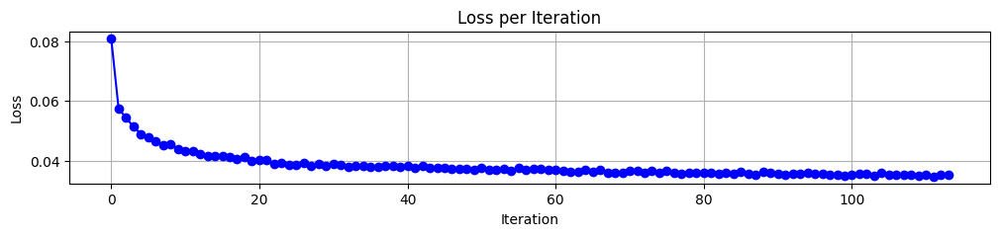

In [125]:
plt.figure(figsize=(12, 2))

# 반복 단위 손실 그래프
plt.plot(train_flatten, label='Train (per iter)', linestyle='-', marker='o', color='blue')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

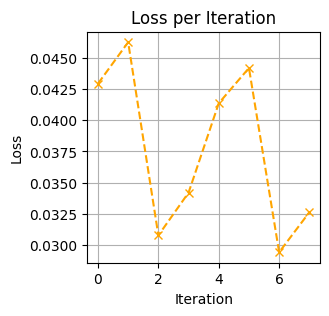

In [126]:
plt.plot(val_flatten, label='Validation (per iter)', linestyle='--', marker='x', color='orange')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

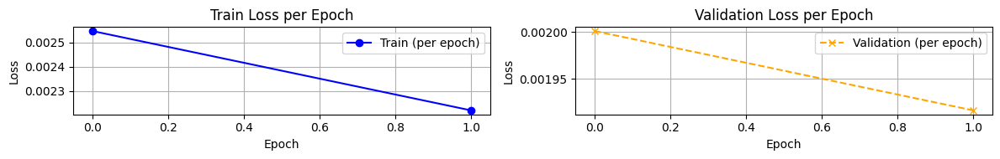

In [127]:
# 1행 2열 레이아웃 생성
fig, axes = plt.subplots(1, 2, figsize=(12, 2))  # 그래프 크기 조정

# Train loss per epoch 그래프
axes[0].plot(train_loss_per_epoch, label='Train (per epoch)', linestyle='-', marker='o', color='blue')
axes[0].set_title("Train Loss per Epoch")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].grid()
axes[0].legend()

# Validation loss per epoch 그래프
axes[1].plot(val_loss_per_epoch, label='Validation (per epoch)', linestyle='--', marker='x', color='orange')
axes[1].set_title("Validation Loss per Epoch")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Loss")
axes[1].grid()
axes[1].legend()

plt.tight_layout()
plt.show()

# 평가

In [128]:
!pwd

/root/code/redcnn/attention_spatial


In [129]:
%cd /root/code/redcnn/attention_spatial

/root/code/redcnn/attention_spatial


In [130]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

## batch size 16

### loss 추이 관찰

In [131]:
criterion = nn.MSELoss()
interval = 1000

# 저장된 모델 로드
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RedCNNWithSpatialAttention().to(device)
model.load_state_dict(torch.load('red_cnn_S_A.pth'))

<All keys matched successfully>

In [132]:
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=0)
len(test_loader)

6025

In [133]:
# evaluate부분 + top10 best&worst
model.eval()
running_loss = 0.0
loss_list = []
total_loss = 0
best_loss = np.inf
worst_loss = -np.inf

with torch.no_grad():
    for i, data in tqdm(enumerate(test_loader), total=len(test_loader), desc=f"Evaluating"):
        X, y = data[0].to(device), data[1].to(device)
        X_hat = model(X)
        loss = criterion(X_hat, y)

        if loss < best_loss:
            best_loss = loss
            best = (X,y,X_hat)
        if loss > worst_loss:
            worst_loss = loss
            worst = (X,y,X_hat)

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

Evaluating:  17%|█▋        | 1022/6025 [00:08<00:42, 118.62it/s]

train loss : 0.03609025924373418


Evaluating:  33%|███▎      | 2018/6025 [00:16<00:33, 118.52it/s]

train loss : 0.03303946304041892


Evaluating:  50%|█████     | 3014/6025 [00:25<00:25, 118.68it/s]

train loss : 0.03436028645536862


Evaluating:  67%|██████▋   | 4022/6025 [00:33<00:16, 118.51it/s]

train loss : 0.02437148917419836


Evaluating:  75%|███████▍  | 4491/6025 [00:37<00:12, 119.55it/s]

Evaluating:  83%|████████▎ | 5019/6025 [00:42<00:08, 118.64it/s]

train loss : 0.02383501827530563


Evaluating: 100%|█████████▉| 6015/6025 [00:50<00:00, 118.46it/s]

train loss : 0.02174551128828898


Evaluating: 100%|██████████| 6025/6025 [00:50<00:00, 119.38it/s]


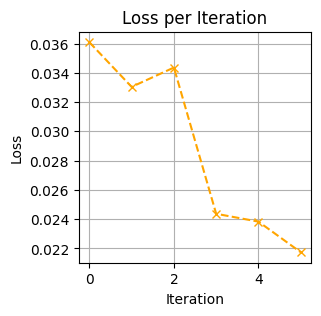

In [134]:
plt.plot(loss_list, label='Test', linestyle='--', marker='x', color='orange')
plt.title("Loss per Iteration")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.grid()
plt.show()

### 16개 개별비교

In [135]:
def visualize_patches_total(X, y, X_hat):

    fig, axes = plt.subplots(3, 16, figsize=(32, 6))  # 3행 16열로 설정
    fig.suptitle("Patches", fontsize=12, y=1.05)  # 전체 제목 추가

    for i in range(X.shape[0]):  # 16개의 이미지만큼 반복
        # X 데이터 시각화
        axes[0, i].imshow(X[i], cmap='gray', vmin=-200, vmax=300)
        axes[0, i].axis('off')
        axes[0, i].set_title(f"X {i+1}", fontsize=12)
        
        # y 데이터 시각화
        axes[1, i].imshow(y[i], cmap='gray', vmin=-200, vmax=300)
        axes[1, i].axis('off')
        axes[1, i].set_title(f"y {i+1}", fontsize=12)
        
        # X_hat 데이터 시각화
        axes[2, i].imshow(X_hat[i], cmap='gray', vmin=-200, vmax=300)
        axes[2, i].axis('off')
        axes[2, i].set_title(f"X_hat {i+1}", fontsize=12)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)  # 제목 위치 조정
    plt.show()


In [136]:
# 1. 랜덤비교

test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=0)
test_iter = iter(test_loader)
len(test_iter)

6025

In [137]:
idx = 400 # 1~6025 여기 안에서 선택
for i in range(idx):
    X_test, y_test = next(test_iter)
    
X = np.squeeze(X_test.cpu().numpy()) * 500 - 500
y = np.squeeze(y_test.cpu().numpy()) * 500 - 500
X_hat = np.squeeze(model(X_test.cuda()).cpu().detach()).numpy() * 500 - 500

In [138]:
X.shape, y.shape, X_hat.shape

((16, 55, 55), (16, 55, 55), (16, 55, 55))

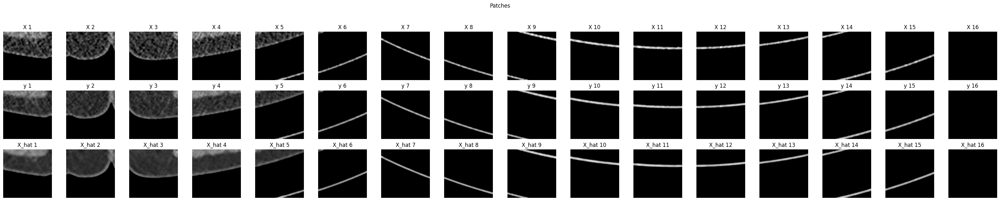

In [139]:
visualize_patches_total(X, y, X_hat)

In [140]:
# 2. 가장 loss가 낮은 값 확인

X_test,y_test,X_hat = best

X = np.squeeze(X_test.cpu().numpy()) * 500 - 500
y = np.squeeze(y_test.cpu().numpy()) * 500 - 500
X_hat = np.squeeze(model(X_test.cuda()).cpu().detach()).numpy() * 500 - 500

In [141]:
X.shape, y.shape, X_hat.shape

((16, 55, 55), (16, 55, 55), (16, 55, 55))

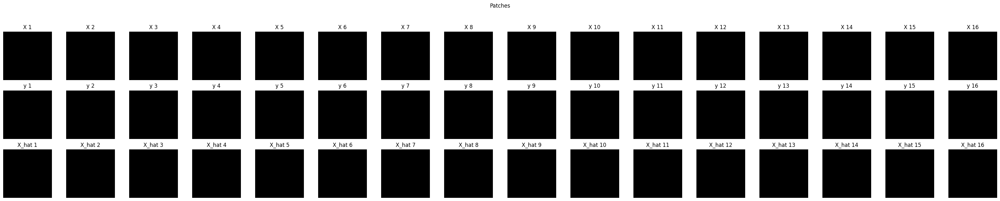

In [142]:
visualize_patches_total(X, y, X_hat)

In [143]:
# 3. 가장 loss가 높은 값 확인

X_test,y_test,X_hat = worst

X = np.squeeze(X_test.cpu().numpy()) * 500 - 500
y = np.squeeze(y_test.cpu().numpy()) * 500 - 500
X_hat = np.squeeze(model(X_test.cuda()).cpu().detach()).numpy() * 500 - 500

In [144]:
X.shape, y.shape, X_hat.shape

((16, 55, 55), (16, 55, 55), (16, 55, 55))

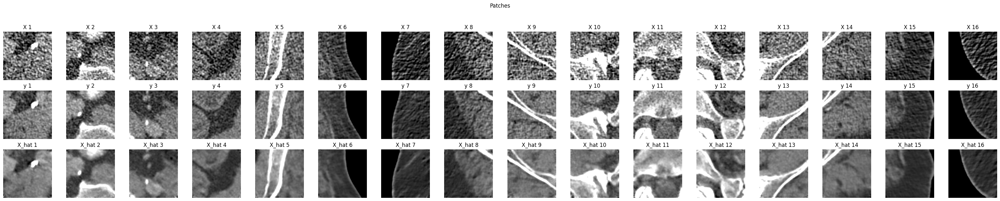

In [145]:
visualize_patches_total(X, y, X_hat)

## batch size = 81

In [146]:
criterion = nn.MSELoss()
interval = 1000

# 저장된 모델 로드
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RedCNNWithSpatialAttention().to(device)
model.load_state_dict(torch.load('red_cnn_S_A.pth'))

<All keys matched successfully>

In [147]:
test_loader = DataLoader(test_dataset, batch_size=81, shuffle=False, num_workers=0)
len(test_loader)

1190

In [148]:
# evaluate부분 + top10 best&worst
model.eval()
running_loss = 0.0
loss_list = []
total_loss = 0
best_loss = np.inf
worst_loss = -np.inf

with torch.no_grad():
    for i, data in tqdm(enumerate(test_loader), total=len(test_loader), desc=f"Evaluating"):
        X, y = data[0].to(device), data[1].to(device)
        X_hat = model(X)
        loss = criterion(X_hat, y)

        if loss < best_loss:
            best_loss = loss
            best = (X,y,X_hat)
        if loss > worst_loss:
            worst_loss = loss
            worst = (X,y,X_hat)

        running_loss += loss.item() * X.size(0)

        if i % interval == interval-1:
            interval_loss = running_loss / interval
            loss_list.append(interval_loss)
            total_loss += running_loss
            running_loss = 0.0
            tqdm.write(f'train loss : {interval_loss}')

Evaluating:  84%|████████▍ | 1005/1190 [00:21<00:03, 46.92it/s]

train loss : 0.15333977253176273


Evaluating: 100%|██████████| 1190/1190 [00:25<00:00, 47.30it/s]


### 함수정의

In [149]:
def reconstruct_image(prediction, num_patches_per_row=9, patch_size=55):
    # prediction: (81, 1, 55, 55) 크기의 torch 텐서
    num_patches = prediction.shape[0]  # 81개의 패치
    assert prediction.shape == (81, 1, 55, 55) # "패치의 크기가 올바르지 않습니다."
    
    # 최종적으로 1x495x495 크기의 이미지를 만들기 위한 초기화
    final_image = torch.zeros(1, num_patches_per_row * patch_size, num_patches_per_row * patch_size)
    
    # 9x9 배열로 패치 붙이기
    for i in range(num_patches):
        row = i // num_patches_per_row  # 현재 패치의 행 번호
        col = i % num_patches_per_row   # 현재 패치의 열 번호
        
        # 패치를 해당 위치에 붙이기
        final_image[:, 
                    row * patch_size:(row + 1) * patch_size, 
                    col * patch_size:(col + 1) * patch_size] = prediction[i, 0]

    return final_image

In [150]:
def extract_patches(img, patch_size=55, interval=55):
    patches = []
    _, height, width = img.shape
    for y in range(0, height - patch_size + 1, interval):
        for x in range(0, width - patch_size + 1, interval):
            patch = img[:, y:y + patch_size, x:x + patch_size]
            patches.append(patch)
    patches = torch.stack(patches)  # 리스트를 텐서로 변환
    return patches  # 반환 형태는 patch 수 x 1 x 55 x 55

In [151]:
def rescale(img):
    return img*500-500 # -1000부터 2000의 값으로 다시 변환

In [152]:
def trans_img(X):
    return rescale(np.squeeze(reconstruct_image(X)))

In [153]:
X_test,y_test,X_hat = best
trans_img(X_test).min(), trans_img(X_test).max()

(tensor(-1024.), tensor(1862.))

In [154]:
!pwd

/root/code/redcnn/attention_spatial


In [155]:
def save_img(X_test, X_hat, y_test, s):
    # X_test 저장
    numpy_X_test = trans_img(X_test).numpy()
    np.save(f'X_test_image{s}.npy', numpy_X_test)
    
    # X_hat 저장
    numpy_X_hat = trans_img(X_hat).numpy()
    np.save(f'X_hat_image{s}.npy', numpy_X_hat)
    
    # y_test 저장
    numpy_y_test = trans_img(y_test).numpy()
    np.save(f'y_test_image{s}.npy', numpy_y_test)

### 1. best

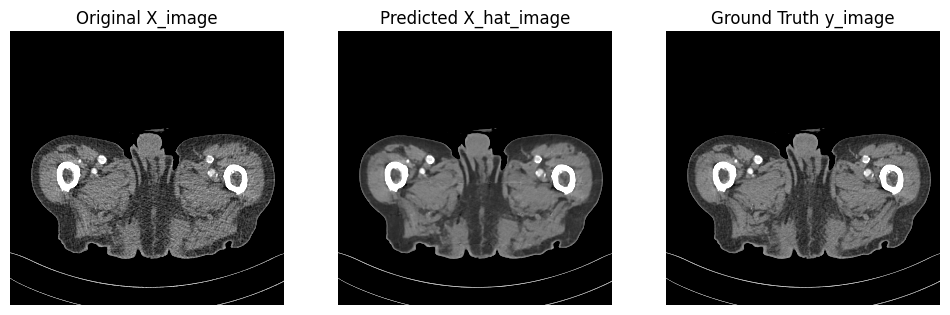

In [156]:
# 1. 가장 좋은 값 가져오기
X_test,y_test,X_hat = best

# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
axes[1].imshow(trans_img(X_hat), cmap='gray', vmin=-200, vmax=300)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
axes[2].imshow(trans_img(y_test), cmap='gray', vmin=-200, vmax=300)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

In [157]:
# 이미지 저장

save_img(X_test, X_hat, y_test, 'best')

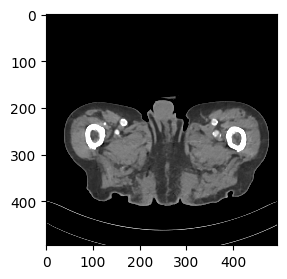

In [158]:
# 불러오기

import numpy as np

s = 'best'
X_test = np.load(f'X_hat_image{s}.npy')

plt.imshow(X_test, cmap='gray', vmin=-200, vmax=300)

### 2. worst

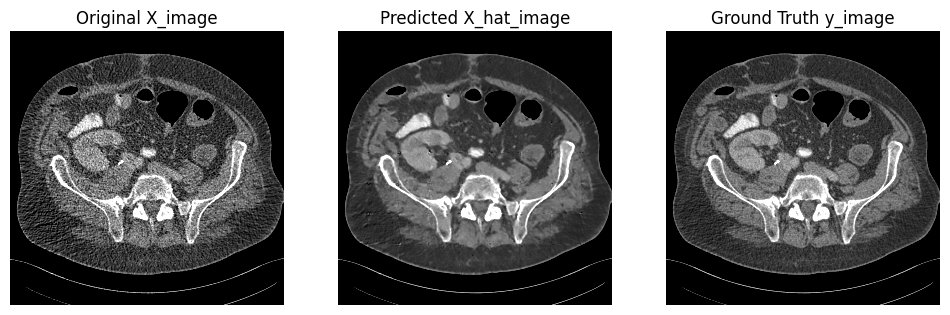

In [159]:
# 2. 가장 나쁜 값 가져오기
X_test,y_test,X_hat = worst

# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
axes[1].imshow(trans_img(X_hat), cmap='gray', vmin=-200, vmax=300)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
axes[2].imshow(trans_img(y_test), cmap='gray', vmin=-200, vmax=300)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

In [160]:
# 이미지 저장

save_img(X_test, X_hat, y_test, 'worst')

### 3. 랜덤

In [161]:
import glob
# 3. 랜덤선택

i,j = 0,0
X_dir = sorted(glob.glob(f'/root/Mayo2016/{L_list[i]}/{data_label[0]}/*.IMA'))[j]
y_dir = sorted(glob.glob(f'/root/Mayo2016/{L_list[i]}/{data_label[1]}/*.IMA'))[j]

X_image, y_image = normlize(X_dir), normlize(y_dir)
X_patches = extract_patches(torch.from_numpy(X_image))

X_image.shape, y_image.shape, X_patches.shape

((1, 512, 512), (1, 512, 512), torch.Size([81, 1, 55, 55]))

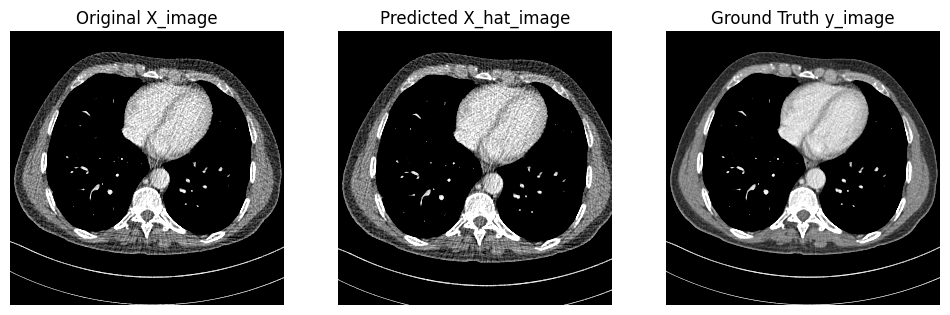

In [162]:
# 세 개의 이미지를 한 줄에 그리기
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# X_image 표시
axes[0].imshow(rescale(np.squeeze(X_image)), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')  # 축 숨기기

# X_hat_image 표시
axes[1].imshow(rescale(np.squeeze(reconstruct_image(X_patches))), cmap='gray', vmin=-200, vmax=300)
axes[1].set_title("Predicted X_hat_image")
axes[1].axis('off')  # 축 숨기기

# y_image 표시
axes[2].imshow(rescale(np.squeeze(y_image)), cmap='gray', vmin=-200, vmax=300)
axes[2].set_title("Ground Truth y_image")
axes[2].axis('off')  # 축 숨기기

# 이미지 보여주기
plt.show()

In [163]:
!pwd

/root/code/redcnn/attention_spatial


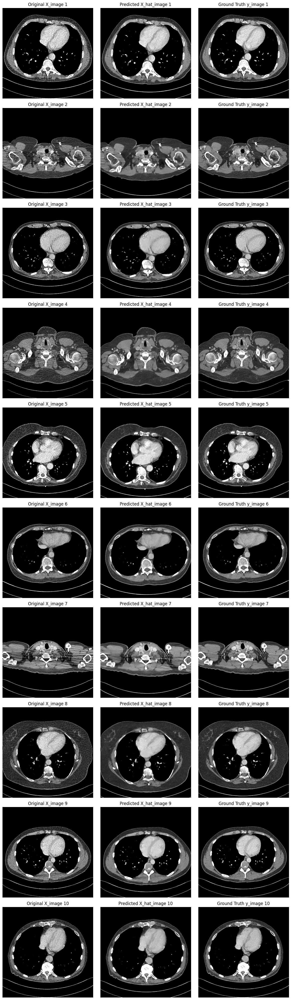

In [164]:
import matplotlib.pyplot as plt
import numpy as np

i, n = 0, 10
L = L_list[i]

# 전체 이미지 배열을 생성
fig, axes = plt.subplots(n, 3, figsize=(12, 4 * n))

for i in range(n):
    X_dir = sorted(glob.glob(f'/root/Mayo2016/{L_list[i]}/{data_label[0]}/*.IMA'))[j]
    y_dir = sorted(glob.glob(f'/root/Mayo2016/{L_list[i]}/{data_label[1]}/*.IMA'))[j]
    X_image, y_image = normlize(X_dir), normlize(y_dir)
    X_patches = extract_patches(torch.from_numpy(X_image))
    X_hat_patches = model(X_patches.cuda()).cpu().detach()
    reconstructed_image = reconstruct_image(X_hat_patches)

    # X_image 표시
    axes[i, 0].imshow(rescale(np.squeeze(X_image)), cmap='gray', vmin=-200, vmax=300)
    axes[i, 0].set_title(f"Original X_image {i+1}")
    axes[i, 0].axis('off')

    # X_hat_image 표시
    axes[i, 1].imshow(rescale(np.squeeze(reconstructed_image)), cmap='gray', vmin=-200, vmax=300)
    axes[i, 1].set_title(f"Predicted X_hat_image {i+1}")
    axes[i, 1].axis('off')

    # y_image 표시
    axes[i, 2].imshow(rescale(np.squeeze(y_image)), cmap='gray', vmin=-200, vmax=300)
    axes[i, 2].set_title(f"Ground Truth y_image {i+1}")
    axes[i, 2].axis('off')

# 모든 이미지 저장
plt.tight_layout()
plt.savefig("comparison_images.png", format="png")  # 한번에 저장
plt.show()  # 모든 이미지 표시

# attention 확인

In [165]:
# 모델 정의
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = RedCNNWithSpatialAttention().to(device)

# 저장된 가중치 로드
model.load_state_dict(torch.load('red_cnn_S_A.pth'))
model.eval()

RedCNNWithSpatialAttention(
  (conv1): Conv2d(1, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv3): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv4): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (conv5): Conv2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (spatial_attention3): SpatialAttention(
    (conv): Conv2d(2, 1, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
    (sigmoid): Sigmoid()
  )
  (spatial_attention5): SpatialAttention(
    (conv): Conv2d(2, 1, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
    (sigmoid): Sigmoid()
  )
  (deconv1): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv2): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv3): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv4): ConvTranspose2d(96, 96, kernel_size=(5, 5), stride=(1, 1))
  (deconv_last): ConvTranspose2d(96, 1, kernel_size=(5, 5), st

## best / worst 이미지의 attention 확인

### 함수정의

In [166]:
def reconstruct_image(prediction, num_patches_per_row=9, patch_size=55):
    # prediction: (81, 1, 55, 55) 크기의 torch 텐서
    num_patches = prediction.shape[0]  # 81개의 패치
    
    # 최종적으로 1x495x495 크기의 이미지를 만들기 위한 초기화
    final_image = torch.zeros(1, num_patches_per_row * patch_size, num_patches_per_row * patch_size)
    
    # 9x9 배열로 패치 붙이기
    for i in range(num_patches):
        row = i // num_patches_per_row  # 현재 패치의 행 번호
        col = i % num_patches_per_row   # 현재 패치의 열 번호
        
        # 패치를 해당 위치에 붙이기
        final_image[:, 
                    row * patch_size:(row + 1) * patch_size, 
                    col * patch_size:(col + 1) * patch_size] = prediction[i, 0]

    return final_image

In [167]:
def extract_patches(img, patch_size=55, interval=55):
    patches = []
    _, height, width = img.shape
    for y in range(0, height - patch_size + 1, interval):
        for x in range(0, width - patch_size + 1, interval):
            patch = img[:, y:y + patch_size, x:x + patch_size]
            patches.append(patch)
    patches = torch.stack(patches)  # 리스트를 텐서로 변환
    return patches  # 반환 형태는 patch 수 x 1 x 55 x 55

In [168]:
def rescale(img):
    return img*500-500 # -1000부터 2000의 값으로 다시 변환

In [169]:
def trans_img(X):
    return rescale(np.squeeze(reconstruct_image(X)))

### 1. best

In [170]:
X_test,y_test,X_hat = best
X_test.shape

torch.Size([81, 1, 55, 55])

In [171]:
X_test.to(device)
output = model(X_test)

In [172]:
# Forward Pass
output = model(X_test)

att_matrix3 = model.spatial_attention3.last_attention
att_matrix5 = model.spatial_attention5.last_attention

att_matrix3.shape, att_matrix5.shape

(torch.Size([81, 1, 43, 43]), torch.Size([81, 1, 35, 35]))

In [173]:
att_matrix3.max(), att_matrix3.min()

(tensor(0.9698, device='cuda:0', grad_fn=<MaxBackward1>),
 tensor(0.5664, device='cuda:0', grad_fn=<MinBackward1>))

In [174]:
att_matrix5.max(), att_matrix5.min()

(tensor(0.5064, device='cuda:0', grad_fn=<MaxBackward1>),
 tensor(0.3239, device='cuda:0', grad_fn=<MinBackward1>))

In [175]:
from decimal import Decimal

# attention2의 mean과 sd 계산
mean3 = Decimal(str(np.mean(att_matrix3.cpu().detach().numpy()))).quantize(Decimal('0.001'))
sd3 = Decimal(str(np.sqrt(np.var(att_matrix3.cpu().detach().numpy())))).quantize(Decimal('0.001'))

# attention3의 mean과 sd 계산
mean5 = Decimal(str(np.mean(att_matrix5.cpu().detach().numpy()))).quantize(Decimal('0.001'))
sd5 = Decimal(str(np.sqrt(np.var(att_matrix5.cpu().detach().numpy())))).quantize(Decimal('0.001'))

# 출력
print(f"Attention 2 - mean: {mean3}, sd: {sd3}")
print(f"Attention 3 - mean: {mean5}, sd: {sd5}")

Attention 2 - mean: 0.836, sd: 0.062
Attention 3 - mean: 0.484, sd: 0.011


In [176]:
att_matrix3_img = reconstruct_image(prediction=att_matrix3, patch_size=att_matrix3.shape[-1])
att_matrix5_img = reconstruct_image(prediction=att_matrix5, patch_size=att_matrix5.shape[-1])

att_matrix3_img.shape, att_matrix5_img.shape

(torch.Size([1, 387, 387]), torch.Size([1, 315, 315]))

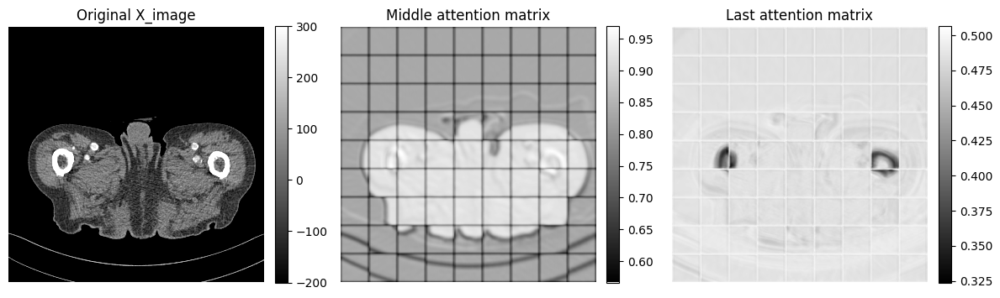

In [177]:
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# 첫 번째 이미지
im0 = axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')
fig.colorbar(im0, ax=axes[0], orientation='vertical', fraction=0.046, pad=0.04)

# 두 번째 이미지
im1 = axes[1].imshow(np.squeeze(att_matrix3_img.detach().cpu().numpy()), cmap='gray')
axes[1].set_title("Middle attention matrix")
axes[1].axis('off')
fig.colorbar(im1, ax=axes[1], orientation='vertical', fraction=0.046, pad=0.04)

# 세 번째 이미지
im2 = axes[2].imshow(np.squeeze(att_matrix5_img.detach().cpu().numpy()), cmap='gray')
axes[2].set_title("Last attention matrix")
axes[2].axis('off')
fig.colorbar(im2, ax=axes[2], orientation='vertical', fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

### 2. worst

In [178]:
X_test,y_test,X_hat = worst
X_test.shape

torch.Size([81, 1, 55, 55])

In [179]:
X_test.to(device)
output = model(X_test)

In [180]:
# Forward Pass
output = model(X_test)

att_matrix3 = model.spatial_attention3.last_attention
att_matrix5 = model.spatial_attention5.last_attention

att_matrix3.shape, att_matrix5.shape

(torch.Size([81, 1, 43, 43]), torch.Size([81, 1, 35, 35]))

In [181]:
from decimal import Decimal

# attention2의 mean과 sd 계산
mean3 = Decimal(str(np.mean(att_matrix3.cpu().detach().numpy()))).quantize(Decimal('0.001'))
sd3 = Decimal(str(np.sqrt(np.var(att_matrix3.cpu().detach().numpy())))).quantize(Decimal('0.001'))

# attention3의 mean과 sd 계산
mean5 = Decimal(str(np.mean(att_matrix5.cpu().detach().numpy()))).quantize(Decimal('0.001'))
sd5 = Decimal(str(np.sqrt(np.var(att_matrix5.cpu().detach().numpy())))).quantize(Decimal('0.001'))

# 출력
print(f"Attention 2 - mean: {mean3}, sd: {sd3}")
print(f"Attention 3 - mean: {mean5}, sd: {sd5}")

Attention 2 - mean: 0.862, sd: 0.064
Attention 3 - mean: 0.484, sd: 0.007


In [182]:
att_matrix3_img = reconstruct_image(prediction=att_matrix3, patch_size=att_matrix3.shape[-1])
att_matrix5_img = reconstruct_image(prediction=att_matrix5, patch_size=att_matrix5.shape[-1])

att_matrix3_img.shape, att_matrix5_img.shape

(torch.Size([1, 387, 387]), torch.Size([1, 315, 315]))

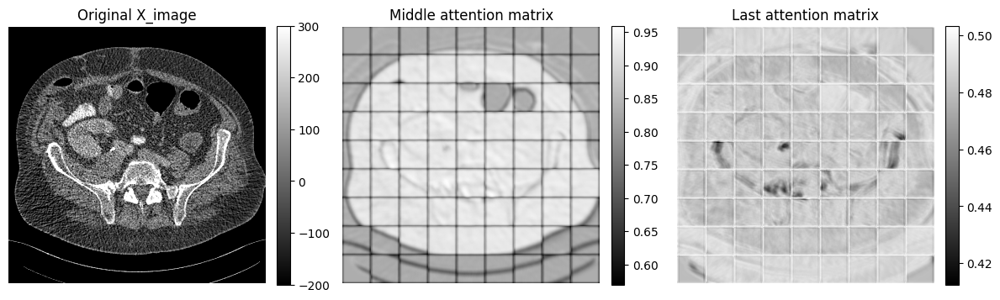

In [183]:
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# 첫 번째 이미지
im0 = axes[0].imshow(trans_img(X_test), cmap='gray', vmin=-200, vmax=300)
axes[0].set_title("Original X_image")
axes[0].axis('off')
fig.colorbar(im0, ax=axes[0], orientation='vertical', fraction=0.046, pad=0.04)

# 두 번째 이미지
im1 = axes[1].imshow(np.squeeze(att_matrix3_img.detach().cpu().numpy()), cmap='gray')
axes[1].set_title("Middle attention matrix")
axes[1].axis('off')
fig.colorbar(im1, ax=axes[1], orientation='vertical', fraction=0.046, pad=0.04)

# 세 번째 이미지
im2 = axes[2].imshow(np.squeeze(att_matrix5_img.detach().cpu().numpy()), cmap='gray')
axes[2].set_title("Last attention matrix")
axes[2].axis('off')
fig.colorbar(im2, ax=axes[2], orientation='vertical', fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()